# Project2: Anomaly Detection for Exotic Event Identification at the Large Hadron Collider 




## Brief Introduction to the Standard Model and Large Hadron Collider


The Standard model (SM) of Particle Physics is the most complete model physicists have for understanding the interactions of the fundamental particles in the universe. The elementary particles of the SM are shown in Fig.1.

---
<figure>
    <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/0/00/Standard_Model_of_Elementary_Particles.svg/627px-Standard_Model_of_Elementary_Particles.svg.png" alt="SM" style="width: 600px;"/>
    <figcaption>Fig.1 - Elementary particles of the Standard Model.</figcaption>
</figure>

---

It is comprised of matter particles (**fermions**):
- **leptons**
    - electrons
    - muon
    - tau
    - and respective neutrinos
- **quarks** which are the building blocks of protons

as well as force carrier particles (**bosons**):
- photon and W/Z bosons (electroweak force)
- gluons (strong force)

and the Higgs boson which is attributed to the mechanism which gives particles their mass.


Though the SM has experimentally stood the test of time, many outstanding questions about the universe and the model itself remain, and scientist continue to probe for inconsistencies in the SM in order to find new physics. More exotic models such as **Supersymmetry (SUSY)** predic mirror particles which may exist and have alluded detection thus far. 

---

The **Large Hadron Collider** (LHC) is a particle smasher capable of colliding protons at a centre of mass energy of 14 TeV.
**ATLAS** is general purpouse particle detectors tasked with recording the remnants of proton collisions at the collicion point. The main purpouse of this experiment is to test the SM rigorously, and ATLAS was one of two expeririments (ATLAS+CMS) responsible for the discovery of the **Higgs boson in 2012**. 

Find an animation of how particles are reconstructed within a slice of the ATLAS detector here: https://videos.cern.ch/record/2770812. Electrons, muons, photons, quark jets, etc, will interact with different layers of the detector in different ways, making it possible to design algorithms which distinguish reconstructed particles, measure their trajectories, charge and energy, and identify them as particular types.

Figure 2 shows an event display from a data event in ATLAS in which 2 muons (red), 2 electrons (green), and 1 quark-jet (purple cone) are found. This event is a candidate to a Higgs boson decaying to four leptons with an associated jet: $$H (+j)\rightarrow 2\mu 2e (+j)$$ 



---

<figure>
    <img src="https://twiki.cern.ch/twiki/pub/AtlasPublic/EventDisplayRun2Physics/JiveXML_327636_1535020856-RZ-LegoPlot-EventInfo-2017-10-18-19-01-24.png" alt="Higgs to leptons" style="width: 600px;"/>
    <figcaption>Fig.2 - Event display of a Higgs candidate decaying to two muons and two electrons.</figcaption>
</figure>

---


Particles are shown transversing the detector material. The 3D histogram show 
* the azimuth $\phi$ ( angle around the beam, 0 is up)
* pseudo-rapidity $\eta$ (trajectory along the beam) positions of the particle directions with respect to the interaction point.
* The total energy measured for the particle is denoted by $E$,
* the transverse momentum ($p_T$) deposited by the particle in giga-electronvolts (GeV) are shown by the hight of the histograms.

A particle kinematics can then be described by a four-vector  $$\bar{p} = (E,p_T,\eta,\phi)$$

An additional importan quantity is the missing energy in the transverse plane (MET). This is calculated by taking the negative sum of the transverse momentum of all particles in the event.
$$\mathrm{MET} = -\sum p_T$$

With perfect detector performance the MET will sum to 0 if all outgoing particles are observed by the detector. Neutrinos cannot be measured by the detector and hence their precense produces non-zero MET.

## Anomally detection dataset

For the anomally detection project we will use the dataset discussed in this publication: <p><a href="https://arxiv.org/pdf/2105.14027.pdf" title="Anomalies">The Dark Machines Anomaly Score Challenge:
Benchmark Data and Model Independent Event
Classification for the Large Hadron Collider</a></p>

Familiarise yourself with the paper, in particular from sections 2.1 to 4.4.

---

The dataset contains a collection of simulated proton-proton collisions in a general particle physics detector (such as ATLAS). We will use a dataset containing `340 000` SM events (referred to as channel 2b in the paper) which have at least 2 electrons/muons in the event with $p_T>15$ GeV. 

**The events can be found in `background_chan2b_7.8.csv`**


You can see all the SM processes that are simulated in Table 2 of the paper, 

    e.g., an event with a process ID of `w_jets` is a simulated event of two protons producing a lepton and neutrino and at least two jets.
    
$$pp\rightarrow \ell\nu(+2j)$$

---

The datasets are collected as CSV files where each line represents a single event, with the current format:

`event ID; process ID; event weight; MET; METphi; obj1, E1, pt1, eta1, phi1; obj2, E2, pt2, eta2, phi2; ...`
See Section 2.2 for a description of the dataset.
Variables are split by a semicolon `";"`
- `event ID`: an identifier for the event number in the simulation
- `process ID`: an identifier for the event simulation type
- `event weight`: the weight associated to the simulated event (how important that event is)
- `MET`: the missing transverse energy
- `METphi`: the azimuth angle (direction) of the MET

the a list of objects (particles) whose variables are split by commas `","` in the following orger:
- `obj`: the object type,

    |Key|Particle|
    |---|---|
    |j|jet|
    |b|b-jet|
    |e-|electron|
    |e+|positron|
    |m-|muon|
    |m+|muon+|
    |g|photon|
    
    *see Table 1 of the paper*
- `E`: the total measured particle energy in MeV, [0,inf]
- `pt`: the transverse mementum in MeV, [0,inf]
- `eta`: pseudo-rapidity, [-inf,inf]
- `phi`: azimuth angle, radians [-3.14,3.14]

---

In addition to the SM events we are also provided simulated events from `Beyond Standard Model` (BSM) exotic physics models. They are summarised here:

|Model | File Name | 
|---|---|
|**SUSY chargino-chargino process**||
||`chacha_cha300_neut140_chan2b.csv`|
||`chacha_cha400_neut60_chan2b.csv`|
||`chacha_cha600_neut200_chan2b.csv`|
|**SUSY chargino-neutralino processes**||
||`chaneut_cha200_neut50_chan2b.csv`|
||`chaneut_cha250_neut150_chan2b.csv`|
|**$Z'$ decay to leptons**||
||`pp23mt_50_chan2b.csv`|
||`pp24mt_50_chan2b.csv`|
|**Gluino and RPV SUSY**||
||`gluino_1000.0_neutralino_1.0_chan2b.csv`||
||`stlp_st1000_chan2b.csv`||



## Project description

### Overview
The task is to design an anomaly detection algorithm which is trained on the SM dataset and which can be used to flag up interesting (exotic) events from the BSM physics models.

You will do this by designing a robust `AutoEncoder` which is trained on the event level variables `MET; METphi` and the kinematics of the particle level objects. The `AutoEncoder` needs to duplicate the input as output effectively while going through a laten space (bottleneck). 

You will then need to evaluate and discuss the performance of your `AutoEncoder` on the exotic models listed above, and come up with an appropiate metric to identify events from non SM physics.

# **Breakdown**

In the project report you will be assessed in the following way.

1. **Data exploration and preprocessing (20%):** Inspect the datasets; visualise the data (e.g. tables, plots, etc) in an appropriate way; study the composition of the dataset; perform any necessary preprocessing.
2. **Model selection (30%):** Choose a promissing approach; construct the machine learning model; optimise the relevant hyperparameters; train your chosen model.
3. **Performance evaluation (30%):** Evaluate the model in a way that gauges its ability to generalise to unseen data; compare to other approaches; identify the best approach. 
4. **Discussion, style throughout (20%):** Discuss the reasoning or intuition behind your choices; the results you obtain through your studies; the relative merits of the methods you have developed, _etc._ Similarly, make sure that you write efficient code, document your work, clearly convey your results, and convince us that you have mastered the material.


## Data Preprocessing
* The data is provided in a CSV (text) format with semicolon and comma seperated list with **one line per event**. We need to convert this into an appropiate format for our neural networks. 
* Since the number of particles per event is variable you will need to **truncate** and **mask** particles in the event. The following steps need to be perfomed on the SM (background) sample:
     1. Create variables where you count the number of electrons, photons, muons, jets and bjets in the event (ignore charge) before any truncation.
     2. Choose an appropiate number of particles to study per event (recommended: **8** particles are used in the paper)
     3. Check the particles are sorted by energy (largest to smallest)
     4. If the event has more than 8 particles choose the **8 particles** with **highest energy and truncate** the rest.
     5. convert energy and momentum variables by logarithm (e.g., `log`) - this is to prioritise differences in energy **scale** over more minor differences. 
     6. If the event has less than 8 particles, create kinematic variables with 0 values for the missing particles.
* The final set of training variables should look something like this (the exact format is up to you)
    |N ele| N muon| N jets| N bjets| N photons| log(MET)| METphi| log(E1)| log(pt1)| eta1| phi1| ... | phi8|
    |-|-|-|-|-|-|-|-|-|-|-|-|-|
    
    7. After the dataset is ready, use `MinMaxScalar` or similar to standardise the training variables over the SM dataset
* After the SM dataset has been processed use the same processing on the BSM (signal samples). Use the same standardisation functions as on the SM dataset, *Do not recalculate the standardisation*.
* Keep associated metatata (`event ID; process ID; event weight;`) though this does not need processing. 
* Randomise and split the SM (background) dataset into training and testing datasets (the BSM samples don't need to be split (*Why?*))
* *Hint*: It is suggested that you write a class or function for the preprocessing which takes a csv path as input and provides the processed dataset. After you have done the data processing its suggested you save the datasets so as to not have to recalculate them again if the kernel is restarted. 

## Training
* Design an appropiate algorithm which reconstrucuts the input variables after going though a laten space. Choose an appropiate cost function.
    * The suggested method for ease of implementation is the `AutoEncoder`
    * However, if you consider learning about or trying something else, as described in the paper, you should feel welcome to try `VAEs`, `ConvAEs`, `ConvVAEs`, etc. Don't feel you **have** to create an `AE`.

* Explore different architectures for the model, and explain in detail your choice of model, and the final parameters chosen.
* It is suggested to create a class or function around your algorithm which allows you to easily tweek hyperparameters of the model (depth, number of nodes, number of laten variables, activation functions, regularisation, etc)
* Train the model over several parameters to find the best algorithm. Document the process throught and discuss your choices. Keep track of validation performance. Save the models the best points. 
* Explore the results and document your findings. Ask as many questions about your model as you can, and document your findings. Does the model generalise well to data it hasn't seen?

## Evaluation
In the evaluation explore different datasets an try answer as many questions about the performance as possible. 
* Evaluate the performance of the `AE` on BSM dataset. Which models are more or less similar to the SM?
* Explore the anomaly score as a handle on finding new physics. Consider scanning over different anomaly scores and calculating the signal and background efficiencies at each point (plot this for different BSM models). How might you choose a value which flags up a non-SM event? 
* Explore SM events. Which look more anomolous than others? Are there any particular features which are responsible, e.g. particle counts, MET ranges, etc.? 
* Discuss any limitations your algorithm has. How might you update and improve your model in future? Discuss any issues you had, or things you would have liked to try given more time.

---

To complete this project, you should **Submit your Jupyter notebook** as a "report." See the comments below on documentation,



**You should submit by Friday 10th Feb 2023 at 10AM:**
* your report notebook via Turnitin.
    

For all task we're not looking for exceptional performace and high scores (although those are nice too), **we're mostly concerned with _best practices:_** If you are careful and deliberate in your work, and show us that you can use the tools introduced in the course so far, we're happy!

Training all of these models in sequence takes a very long time so **don't spend hours on training hundreds of epochs.** Be conservative on epoch numbers (30 is more than enough) and use appropiate techniques like EarlyStopping to speed things up. Once you land on a good model you can allow for longer training times if performance can still improve.



### Documentation

**Change the filename to contain Name_Surname**

Your report notebook should run without errors and give (mostly) reproducible results. **Please dont clear the report before submitting**! It is important that **all** code is annotated and that you provide brief commentary **at each step** to explain your approach. Explain *why* you chose a given approach and *discuss* the results. You can also include any failed approaches if you provide reasonable explanation; we care more about you making an effort and showing that you understand the core concepts.

This is not in the form of a written report so do not provide pages of background material, but do try to clearly present your work so that the markers can easily follow your reasoning and can reproduce each of the steps through your analysis. Aim to convince us that you have understood the material covered in the course.

To add commentary above (or below) a code snippet create a new cell and add your text in "Markdown" format. Do not add any substantial commentary as a code comment in the same cell as the code. To change the new cell into markdown select from the drop down menu on the bar above the main window (the default is code)

# Happy Anomaly Hunting
---
<blockquote class="twitter-tweet"><p lang="en" dir="ltr">Data Scientist (n.): Person who is better at statistics than any software engineer and better at software engineering than any statistician.</p>&mdash; Josh Wills (@josh_wills) <a href="https://twitter.com/josh_wills/status/198093512149958656?ref_src=twsrc%5Etfw">May 3, 2012</a></blockquote> <script async src="https://platform.twitter.com/widgets.js" charset="utf-8"></script> 

---

Your code follows....

In [1]:
# Standard import(s)
import numpy as np
import pandas as pd
import random as rn
import sklearn
import tensorflow as fff
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.inspection import PartialDependenceDisplay
%matplotlib inline

# Suppress unnecessary ConvergenceWarnings and DeprecationWarnings
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings(action='ignore', category=ConvergenceWarning)
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

In [2]:
import sys
sys.version

'3.9.13 | packaged by conda-forge | (main, May 27 2022, 17:00:52) \n[Clang 13.0.1 ]'



# Data exploration and preprocessing  

The first part I did for he project was processing the data. This involved the following:

* I defined a function that reads the .csv files into a pandas dataframe, and then I transform it to  numpy array in order to sort the particles in each event in terms of energy (largest to smallest energy).
* I count using the given labels how many jets, b-jets, electrons/positrons, muons, and photons I have per event.
* After having sorted all the particles then I cat the array to only have stored 8 particles per event (the 8 particles of the event with the higest energi
* Also, when the event didn't have 8 particles, the NaN values where replaced by 0s.
* Lastly I tidy up the resulting array, give new labels, and put the energies in logarithm.
* This function then returns and array with the sorted and processed data.

In [3]:
def process_data (path):

    observables = ["Event ID", "Process ID", "Event Weight", "MET", "MET phi", "Obj1", "E1", "pt1", "eta1", "phi1", "Obj2", "E2", "pt2", "eta2", "phi2", "Obj3", "E3", "pt3", "eta3", "phi3", "Obj4",  "E4", "pt4", "eta4", "phi4","Obj5", "E5", "pt5", "eta5", "phi5", "Obj6",  "E6", "pt6", "eta6", "phi6","Obj7",  "E7", "pt7", "eta7", "phi7","Obj8",  "E8", "pt8", "eta8", "phi8","Obj9", "E9", "pt9", "eta9", "phi9", "Obj10",  "E10", "pt10", "eta10", "phi10","Obj11", "E11", "pt11", "eta11", "phi11", "Obj12", "E12", "pt12", "eta12", "phi12", "Obj13", "E13", "pt13", "eta13", "phi13", "Obj14",  "E14", "pt14", "eta14", "phi14", "Obj15", "E15", "pt15", "eta15", "phi15"]


    # Load in the data
    events = pd.read_csv(path, sep=";|,", names=observables, engine = "python")

    # to be able to sort from largest to smallest value of energy without NaN 
    events2 = events.fillna(-np.inf)
    
    # transform to numpy array 
    d_array = events2.values

    # 3D array to store each particle of each event
    data_array = d_array.reshape(d_array.shape[0], 16,5)

    # array where we are going to store the number of each type of jet 
    particles = np.zeros([np.shape(d_array)[0],5])

    # sorting from largest to smallest energy particles and truncating to only have 8 particles per event
    for i in range(data_array.shape[0]):

        data_array[i,1:,:] = data_array[i,1:,:][data_array[i,1:,1].argsort()[::-1]]
        
    for i in range(data_array.shape[0]):

        # counters to store the number of particles for each event
        j = 0
        b = 0 
        g = 0
        m = 0
        e = 0 

        for p in range(16):
            
            # this checks all the "Obj" labels withouth having to read all the elements in the event
            k = data_array[i, p, 0]

            if k == str("j"):
                j += 1

            if k == str("b"):
                b += 1

            if k == str("g"):
                g += 1

            if k == str("m+") or k == str("m-"):
                m += 1

            if k == str("e-") or k == str("e+"):
                e += 1

            # array to store the particle numbers
            particles[i,0] = j
            particles[i,1] = b
            particles[i,2] = g
            particles[i,3] = m
            particles[i,4] = e

    sort_clipped = data_array[:,:9,:]





    # rehsape the sorted and clipped array to flatten it 
    sort_clipped = sort_clipped.reshape(sort_clipped.shape[0], 45)
    
    # add the "number of particles" array to the final array
    final = np.concatenate((particles, sort_clipped) , axis=1)
    
    # new labels
    observables2 = [ "Nj", "Nb", "Ng", "Nm", "Ne", "Event ID", "Process ID", "Event Weight", "MET", "MET phi", "Obj1", "E1", "pt1", "eta1", "phi1", "Obj2", "E2", "pt2", "eta2", "phi2", "Obj3", "E3", "pt3", "eta3", "phi3", "Obj4",  "E4", "pt4", "eta4", "phi4","Obj5", "E5", "pt5", "eta5", "phi5", "Obj6",  "E6", "pt6", "eta6", "phi6","Obj7",  "E7", "pt7", "eta7", "phi7","Obj8",  "E8", "pt8", "eta8", "phi8" ]
    events3 = pd.DataFrame(final) 
    events3.columns = observables2
    events3.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # drop object labels
    events4 = events3.drop(columns = ["Event ID", "Process ID", "Event Weight", "Obj1", "Obj2", "Obj3", "Obj4", "Obj5", "Obj6", "Obj7", "Obj8"])
    
    # calculate log of energies 
    events4['MET'] = np.log(events4['MET'])
    events4['E1'] = np.log(events4['E1'])
    events4['E2'] = np.log(events4['E2'])
    events4['E3'] = np.log(events4['E3'])
    events4['E4'] = np.log(events4['E4'])
    events4['E5'] = np.log(events4['E5'])
    events4['E6'] = np.log(events4['E6'])
    events4['E7'] = np.log(events4['E7'])
    events4['E8'] = np.log(events4['E8'])
    
    observables3 = [ "Nj", "Nb", "Ng", "Nm", "Ne", "logMET", "MET phi", "logE1", "pt1", "eta1", "phi1", "logE2", "pt2", "eta2", "phi2", "logE3", "pt3", "eta3", "phi3", "logE4", "pt4", "eta4", "phi4","logE5", "pt5", "eta5", "phi5", "logE6", "pt6", "eta6", "phi6", "logE7", "pt7", "eta7", "phi7", "logE8", "pt8", "eta8", "phi8" ]
    
    events4.columns = observables3
    events4 = events4.fillna(0)
    
    data_array = events4.values



    return data_array

I call the function with all the provided data to get the processed arrays:

In [4]:
sm_array = process_data('background_chan2b_7.8.csv') # SM arrays, ie "background"

In [6]:
chacha1_array = process_data("chacha_cha300_neut140_chan2b.csv")  # SUSY chargino-chargino cha300 neut140

In [8]:
chacha2_array = process_data("chacha_cha400_neut60_chan2b.csv")  # SUSY chargino-chargino cha300 neut60

In [9]:
chacha3_array = process_data("chacha_cha600_neut200_chan2b.csv")  # SUSY chargino-chargino cha600 neut200

In [10]:
chaneut1_array = process_data("chaneut_cha200_neut50_chan2b.csv") # SUSY chargino-neutralino cha200 neut50

In [11]:
chaneut2_array = process_data("chaneut_cha250_neut150_chan2b.csv") # SUSY chargino-neutralino cha250 neut150

In [12]:
z1_array = process_data("pp23mt_50_chan2b.csv") # Z' decay to leptons pp23mt

In [13]:
z2_array = process_data("pp24mt_50_chan2b.csv") # Z' decay to leptons pp24mt

In [14]:
glu1_array = process_data("stlp_st1000_chan2b.csv") # gluino and RPV SUSY 

The following step I followed was to standarise the trainning variables. I did that using MinMaxScaler (hence my variables now go from 0 to 1). I did the fit_transform on the SM data ("background"), and only "transform" on the BSM data, ie. I didn't recalculated the standarization. Also I splited the SM data into trainning and testing data (this is not necessary to do on the BSM data and we are not going to train the autoencoder model with it).

In [15]:
from sklearn.preprocessing import MinMaxScaler

In [16]:
scaler = MinMaxScaler()

In [17]:
sm_scaled = scaler.fit_transform(sm_array)

In [18]:
# split the data into train and test set
train, test = sklearn.model_selection.train_test_split(sm_scaled, test_size=0.2, random_state=42, shuffle=True)

In [19]:
chacha1_scaled = scaler.transform(chacha1_array)

In [20]:
chacha2_scaled = scaler.transform(chacha2_array)

In [21]:
chacha3_scaled = scaler.transform(chacha3_array)

In [22]:
chaneut1_scaled = scaler.transform(chaneut1_array)

In [23]:
chaneut2_scaled = scaler.transform(chaneut2_array)

In [24]:
z1_scaled = scaler.transform(z1_array)

In [25]:
z2_scaled = scaler.transform(z2_array)

In [85]:
glu1_scaled = scaler.transform(glu1_array)

In general, this part was very straight forward, with the main challenges being the used of indices with numpy arrays and reshaping into 3D arrays (it took me several trials until getting the right indeces/numbers). Another challenge was trying to find an 'ideal' way of reading the data from the .csv file, I first tried using only numpy but I found pandas much better to handle the separators. Everything was doing caregully as the data you feed to your model is one of the most important things.

# Trainning

This part took me more thinking. Some of the only things I had clear from the beginning was that a simple AutoEncoder should be enough and that the AE didn't need convolution layers (as we were not doing a convolution netwok). Another thing I had in mind so I didn't do much testing regarding that was that my last activation function for the last layer had to be "sigmoid" as, after using the MinMaxScaler all my variables were between 0 and 1, and "sigmoid" activation function returns that, values between 0 and 1. 

In [26]:
import tensorflow as tf
# Keras import(s)
if float(tf.__version__[:3])>2.8:
    from tensorflow.keras.utils import plot_model
else:
    from tensorflow.python.keras.utils.vis_utils import plot_model
from tensorflow.python.keras.models import Model
from tensorflow.python.keras.layers import Input, Dense, Flatten, Reshape, Conv2D, MaxPooling2D, AveragePooling2D, UpSampling2D
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from tensorflow.keras import regularizers

from tensorflow.python.keras.backend import set_image_data_format
set_image_data_format('channels_last')

First thing I did was definning a callback (from Keras) as I wanted to use early stopping in my trainning in order to regularize the model (waht this does is basically stop trainning the mdel when the validation error reaches a minimum). That way I'm not over trainning or wasting time with too many epochs. (I will be using this later when I fit the model as a callback)

In [27]:
from tensorflow.keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(patience = 1)
# patience = 3 means that the trainning is terminated when 1 epochs with no improvement

One AE that I wanted to try without much modification or optimization was the one described in the given paper [1] (the paper that used that given data). I called that model **cae_paper**. (It's described in the Table 6 and I made some small modifications as I processed the data (scaled it) in a different way, do for instance instead of using tanh activation function at the end I used sigmoid)

|Parameter | Model: *cae_paper* | 
|---|---|
|**activation**| sigmoid|
|**dropout**|None|
|**latent dim**|10|
|**# layers**|3|
|**optimizer**|Adam|
|**dense layers**|200, 200, 20|

Model: "model_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 39)]              0         
_________________________________________________________________
dense_92 (Dense)             (None, 200)               8000      
_________________________________________________________________
dense_93 (Dense)             (None, 200)               40200     
_________________________________________________________________
dense_94 (Dense)             (None, 20)                4020      
_________________________________________________________________
dense_95 (Dense)             (None, 10)                210       
Total params: 52,430
Trainable params: 52,430
Non-trainable params: 0
_________________________________________________________________


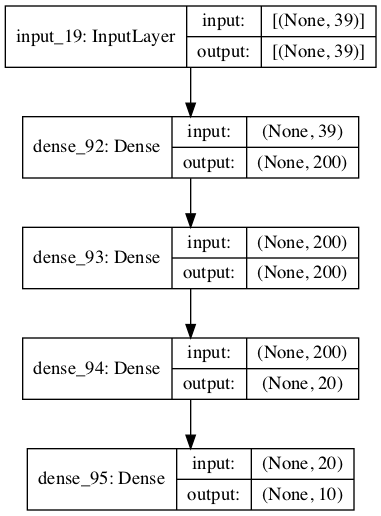

In [233]:
# constructing the encoder
input = Input(shape=(39,))
x = Dense(200, activation="relu")(input) #x name of the hidden layer
y = Dense(200, activation="relu")(x)
z = Dense(20, activation="relu")(y)
output = Dense(10,activation="relu")(z)
model_enc = Model(input, output)
model_enc.compile("adam", loss="mse", metrics = "accuracy" )

model_enc.summary()
plot_model(model_enc, show_shapes = "True")

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 10)]              0         
_________________________________________________________________
dense_4 (Dense)              (None, 20)                220       
_________________________________________________________________
dense_5 (Dense)              (None, 200)               4200      
_________________________________________________________________
dense_6 (Dense)              (None, 200)               40200     
_________________________________________________________________
dense_7 (Dense)              (None, 39)                7839      
Total params: 52,459
Trainable params: 52,459
Non-trainable params: 0
_________________________________________________________________


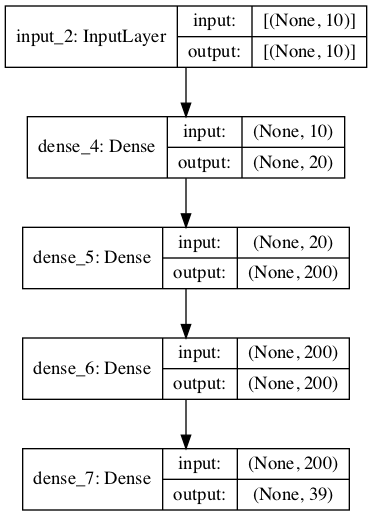

In [29]:
# constructing the decoder
input_dec = Input(shape=(10))
hidden  = Dense(20, activation = "relu" )(input_dec)
hidden2  = Dense(200, activation = "relu" )(hidden)
x  = Dense(200, activation = "relu" )(hidden2)
y  = Dense(39, activation = "sigmoid" )(x)

model_dec = Model(input_dec, y)
model_dec.summary()
plot_model(model_dec, show_shapes = "True")

Model: "ConvAE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 39)]              0         
_________________________________________________________________
model (Functional)           (None, 10)                52430     
_________________________________________________________________
model_1 (Functional)         (None, 39)                52459     
Total params: 104,889
Trainable params: 104,889
Non-trainable params: 0
_________________________________________________________________


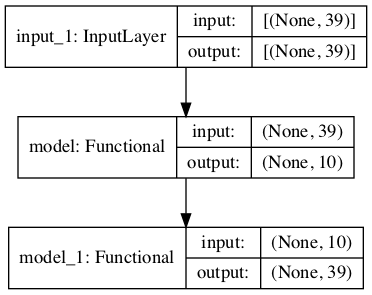

In [30]:
# construct the autoencoder
i   = model_enc.input
cae_paper = Model(i, model_dec(model_enc(i)), name='ConvAE')  

cae_paper.summary()
plot_model(cae_paper, show_shapes = "True")

In [31]:
cae_paper.compile("adam", loss="mse", metrics=["mse"])
history_cae_paper = cae_paper.fit(train, train, epochs=30, batch_size=32, validation_split = 0.2, validation_data = (test,test), callbacks = [early_stopping]) 

2023-02-16 19:12:18.199405: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)


Epoch 1/30
6806/6806 [==============================] - 29s 4ms/step - loss: 0.0159 - mse: 0.0159 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 2/30
6806/6806 [==============================] - 25s 4ms/step - loss: 0.0075 - mse: 0.0075 - val_loss: 0.0067 - val_mse: 0.0067
Epoch 3/30
6806/6806 [==============================] - 26s 4ms/step - loss: 0.0064 - mse: 0.0064 - val_loss: 0.0059 - val_mse: 0.0059
Epoch 4/30
6806/6806 [==============================] - 26s 4ms/step - loss: 0.0055 - mse: 0.0055 - val_loss: 0.0045 - val_mse: 0.0045
Epoch 5/30
6806/6806 [==============================] - 25s 4ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0043 - val_mse: 0.0043
Epoch 6/30
6806/6806 [==============================] - 26s 4ms/step - loss: 0.0042 - mse: 0.0042 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 7/30
6806/6806 [==============================] - 26s 4ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0040 - val_mse: 0.0040
Epoch 8/30
6806/6806 [==============================] -

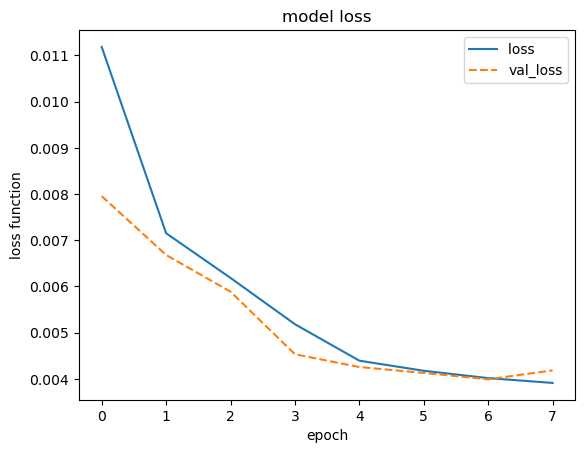

In [32]:
# plot losses to check that autoencoder is trainning correctly
plt.plot(history_cae_paper.history['loss'])
plt.plot(history_cae_paper.history['val_loss'],linestyle='dashed')
plt.title('model loss')
plt.ylabel('loss function')
plt.xlabel('epoch')
plt.legend(['loss ', 'val_loss' ], loc='upper right')
plt.show()

A small test was done by fitting the model with different hyperparameters (in particular different batch_size) to see if there was any change appart from time it takes to run.

In [33]:
# constructing the encoder
input = Input(shape=(39,))
x = Dense(200, activation="relu")(input) #x name of the hidden layer
y = Dense(200, activation="relu")(x)
z = Dense(20, activation="relu")(y)
output = Dense(10,activation="relu")(z)
model_enc = Model(input, output)
model_enc.compile("adam", loss="mse", metrics = "accuracy" )
# constructing the decoder
input_dec = Input(shape=(10))
hidden  = Dense(20, activation = "relu" )(input_dec)
hidden2  = Dense(200, activation = "relu" )(hidden)
x  = Dense(200, activation = "relu" )(hidden2)
y  = Dense(39, activation = "sigmoid" )(x)
model_dec = Model(input_dec, y)
# construct the autoencoder
i   = model_enc.input
cae_paper2 = Model(i, model_dec(model_enc(i)), name='ConvAE')  
cae_paper2.compile("adam", loss="mse", metrics=["mse"])
history_cae_paper2 = cae_paper2.fit(train, train, epochs=30, batch_size=64, validation_split = 0.2, validation_data = (test,test), callbacks = [early_stopping]) 

Epoch 1/30
3403/3403 [==============================] - 16s 4ms/step - loss: 0.0162 - mse: 0.0162 - val_loss: 0.0044 - val_mse: 0.0044
Epoch 2/30
3403/3403 [==============================] - 15s 4ms/step - loss: 0.0043 - mse: 0.0043 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 3/30
3403/3403 [==============================] - 15s 4ms/step - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 4/30
3403/3403 [==============================] - 15s 4ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 5/30
3403/3403 [==============================] - 15s 4ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 6/30
3403/3403 [==============================] - 15s 4ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 7/30
3403/3403 [==============================] - 14s 4ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0029 - val_mse: 0.0029
Epoch 8/30
3403/3403 [==============================] -

In [34]:
# constructing the encoder
input = Input(shape=(39,))
x = Dense(200, activation="relu")(input) #x name of the hidden layer
y = Dense(200, activation="relu")(x)
z = Dense(20, activation="relu")(y)
output = Dense(10,activation="relu")(z)
model_enc = Model(input, output)
model_enc.compile("adam", loss="mse", metrics = "accuracy" )
# constructing the decoder
input_dec = Input(shape=(10))
hidden  = Dense(20, activation = "relu" )(input_dec)
hidden2  = Dense(200, activation = "relu" )(hidden)
x  = Dense(200, activation = "relu" )(hidden2)
y  = Dense(39, activation = "sigmoid" )(x)

model_dec = Model(input_dec, y)
# construct the autoencoder
i   = model_enc.input
cae_paper3 = Model(i, model_dec(model_enc(i)), name='ConvAE')  
cae_paper3.compile("adam", loss="mse", metrics=["mse"])
history_cae_paper3 = cae_paper3.fit(train, train, epochs=30, batch_size=16, validation_split = 0.2, validation_data = (test,test), callbacks = [early_stopping]) 

Epoch 1/30
13611/13611 [==============================] - 43s 3ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 2/30
13611/13611 [==============================] - 43s 3ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 3/30
13611/13611 [==============================] - 43s 3ms/step - loss: 0.0030 - mse: 0.0030 - val_loss: 0.0028 - val_mse: 0.0028
Epoch 4/30
13611/13611 [==============================] - 43s 3ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0026 - val_mse: 0.0026
Epoch 5/30
13611/13611 [==============================] - 43s 3ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 6/30
13611/13611 [==============================] - 54s 4ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0025 - val_mse: 0.0025
Epoch 7/30
13611/13611 [==============================] - 47s 3ms/step - loss: 0.0024 - mse: 0.0024 - val_loss: 0.0023 - val_mse: 0.0023
Epoch 8/30
13611/13611 [=================

In [35]:
print(history_cae_paper.history['loss'][-1])
print(history_cae_paper.history['val_loss'][-1])
print(history_cae_paper2.history['loss'][-1])
print(history_cae_paper2.history['val_loss'][-1])
print(history_cae_paper3.history['loss'][-1])
print(history_cae_paper3.history['val_loss'][-1])

0.003913063555955887
0.004184645134955645
0.002325886394828558
0.0023769917897880077
0.002268268493935466
0.0022880807518959045


After doing this first test I realized that copying and pasting the model and only changing one variable everytime was not efficient so I probably had to define a function. I also saw that a batch size between 16, 32, and 64 does not make a huge difference.

So following I defined functions for the encoder and decoder to modify them in an easier way. Where I can choose the number fo dense hidden layers, the dimension of the lantent space, and the dimension of the firt dense layer. I called this models "cae_yy". The function for the autoencoder also allows to change easily the number of epochs and the batch size.

In [36]:
def encoder_yy(dense_layers, activation):
    
    input = Input(shape=(39,))
    y = input
    
    for layer in dense_layers:       
        
        y = Dense(layer, activation=activation)(y) 

    model_enc = Model(input, y)
        
    model_enc.compile("adam", loss="mse", metrics = ["mse"] )
    plot_model(model_enc, show_shapes = "True")
    
    return model_enc

In [37]:
def decoder_yy(dense_layers, activation):
    
    dense_layers = np.array(dense_layers)
    dense_layers_reversed = dense_layers[::-1]
    
    input_dec = Input(shape=(dense_layers_reversed[0],))
    y = input_dec
    
    dense_l = dense_layers_reversed[1:]
    
    dense_la = dense_l.tolist()
    
    for layer in dense_la:
    
        
        y  = Dense(layer, activation = activation )(y)
    
    y  = Dense(39, activation = "sigmoid" )(y)

    model_dec = Model(input_dec, y)
    plot_model(model_dec, show_shapes = "True")
    
    return model_dec

In [38]:
def autoencoder_yy(model_enc, model_dec, epochs, batch_size):
    
    i   = model_enc.input
    cae = Model(i, model_dec(model_enc(i)), name='ConvAE')
    
    cae.compile("adam", loss="mse", metrics = ["mse"])
    history_cae = cae.fit(train, train, epochs= epochs, batch_size= batch_size,  validation_data = (test,test), callbacks = [early_stopping]) 
    
    return history_cae, cae

In [39]:
layers_yy1 = [400,200,100,20,10]

In [40]:
enc_yy1 = encoder_yy(layers_yy1, "relu")

In [41]:
dec_yy1 = decoder_yy(layers_yy1, "relu")

In [42]:
history_cae_yy1, cae_yy1 = autoencoder_yy(enc_yy1, dec_yy1,30, 32 )

Epoch 1/30
8507/8507 [==============================] - 46s 5ms/step - loss: 0.0124 - mse: 0.0124 - val_loss: 0.0041 - val_mse: 0.0041
Epoch 2/30
8507/8507 [==============================] - 44s 5ms/step - loss: 0.0040 - mse: 0.0040 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 3/30
8507/8507 [==============================] - 46s 5ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 4/30
8507/8507 [==============================] - 46s 5ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 5/30
8507/8507 [==============================] - 44s 5ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0031 - val_mse: 0.0031


In [43]:
layers_yy2 = [1000,900,800,700,600,500,400,300,200,100,50,20,10]
enc_yy2 = encoder_yy(layers_yy2, "relu")
dec_yy2 = decoder_yy(layers_yy2, "relu")

In [44]:
history_cae_yy2, cae_yy2 = autoencoder_yy(enc_yy2, dec_yy2,30, 32 )

Epoch 1/30
8507/8507 [==============================] - 746s 87ms/step - loss: 0.0209 - mse: 0.0209 - val_loss: 0.0183 - val_mse: 0.0183
Epoch 2/30
8507/8507 [==============================] - 1504s 177ms/step - loss: 0.0170 - mse: 0.0170 - val_loss: 0.0162 - val_mse: 0.0162
Epoch 3/30
8507/8507 [==============================] - 756s 89ms/step - loss: 0.0168 - mse: 0.0168 - val_loss: 0.0167 - val_mse: 0.0167


I stopped history_cae_yy2, the model cae_yy2 is tales too long to train and the looses are not even looking that good, but from that I learnt that too many layers don't equal less looses but equals more trainning time, so more expensive.

In [45]:
layers_yy3 = [100, 60, 30, 10]
enc_yy3 = encoder_yy(layers_yy3, "relu")
dec_yy3 = decoder_yy(layers_yy3, "relu")

In [46]:
history_cae_yy3, cae_yy3 = autoencoder_yy(enc_yy3, dec_yy3,30, 32 )

Epoch 1/30
8507/8507 [==============================] - 26s 3ms/step - loss: 0.0127 - mse: 0.0127 - val_loss: 0.0042 - val_mse: 0.0042
Epoch 2/30
8507/8507 [==============================] - 25s 3ms/step - loss: 0.0041 - mse: 0.0041 - val_loss: 0.0039 - val_mse: 0.0039
Epoch 3/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 4/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0037 - mse: 0.0037 - val_loss: 0.0036 - val_mse: 0.0036
Epoch 5/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0036 - mse: 0.0036 - val_loss: 0.0035 - val_mse: 0.0035
Epoch 6/30
8507/8507 [==============================] - 25s 3ms/step - loss: 0.0035 - mse: 0.0035 - val_loss: 0.0034 - val_mse: 0.0034
Epoch 7/30
8507/8507 [==============================] - 26s 3ms/step - loss: 0.0034 - mse: 0.0034 - val_loss: 0.0036 - val_mse: 0.0036


In [47]:
layers_yy4 = [100, 60, 30, 30]
enc_yy4 = encoder_yy(layers_yy4, "relu")
dec_yy4 = decoder_yy(layers_yy4, "relu")

In [48]:
history_cae_yy4, cae_yy4 = autoencoder_yy(enc_yy4, dec_yy4,30, 32 )

Epoch 1/30
8507/8507 [==============================] - 25s 3ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0013 - val_mse: 0.0013
Epoch 2/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 8.1083e-04 - val_mse: 8.1083e-04
Epoch 3/30
8507/8507 [==============================] - 24s 3ms/step - loss: 7.6276e-04 - mse: 7.6276e-04 - val_loss: 6.4461e-04 - val_mse: 6.4461e-04
Epoch 4/30
8507/8507 [==============================] - 24s 3ms/step - loss: 6.5842e-04 - mse: 6.5842e-04 - val_loss: 5.6334e-04 - val_mse: 5.6334e-04
Epoch 5/30
8507/8507 [==============================] - 24s 3ms/step - loss: 5.9780e-04 - mse: 5.9780e-04 - val_loss: 4.8597e-04 - val_mse: 4.8597e-04
Epoch 6/30
8507/8507 [==============================] - 24s 3ms/step - loss: 4.9372e-04 - mse: 4.9372e-04 - val_loss: 4.5583e-04 - val_mse: 4.5583e-04
Epoch 7/30
8507/8507 [==============================] - 24s 3ms/step - loss: 5.5119e-04 - mse: 5.5119e-04 - val_loss: 

In [49]:
layers_yy5 = [100, 60, 30, 5]
enc_yy5 = encoder_yy(layers_yy5, "relu")
dec_yy5 = decoder_yy(layers_yy5, "relu")

In [50]:
history_cae_yy5 = autoencoder_yy(enc_yy5, dec_yy5,30, 32 )

Epoch 1/30
8507/8507 [==============================] - 25s 3ms/step - loss: 0.0185 - mse: 0.0185 - val_loss: 0.0121 - val_mse: 0.0121
Epoch 2/30
8507/8507 [==============================] - 25s 3ms/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.0108 - val_mse: 0.0108
Epoch 3/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0098 - val_mse: 0.0098
Epoch 4/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 5/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0090 - mse: 0.0090 - val_loss: 0.0087 - val_mse: 0.0087
Epoch 6/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0085 - mse: 0.0085 - val_loss: 0.0083 - val_mse: 0.0083
Epoch 7/30
8507/8507 [==============================] - 24s 3ms/step - loss: 0.0083 - mse: 0.0083 - val_loss: 0.0080 - val_mse: 0.0080
Epoch 8/30
8507/8507 [==============================] -

After trainning a few models I found the cae_yy4 to have a weird loss so I'm going to plot it:

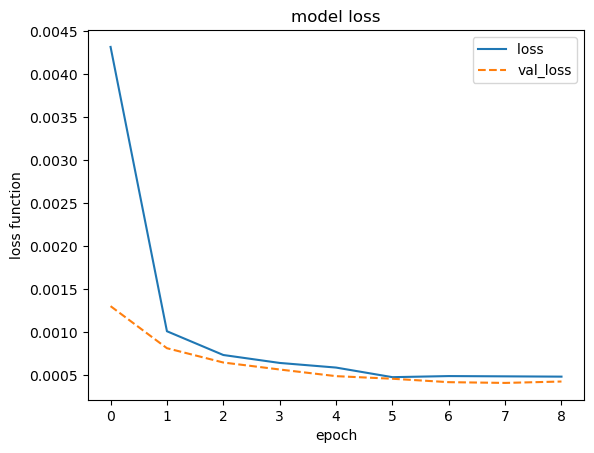

In [51]:
# plot losses to check that autoencoder is trainning correctly
plt.plot(history_cae_yy4.history['loss'])
plt.plot(history_cae_yy4.history['val_loss'],linestyle='dashed')
plt.title('model loss')
plt.ylabel('loss function')
plt.xlabel('epoch')
plt.legend(['loss ', 'val_loss' ], loc='upper right')
plt.show()

The loss for the *cae_yy4* model is very low which is good, but it might be because the latent space is a bit too big. Similarly a latent space that it's too small (like for *cae_yy5*) is not that good either. So far all then models have been giving a similar performance, except *cae_yy2* that was taking a long long time to run and was not even trainning that well and *cae_yy5* whose latent space might have been too small. I haven't been too picky in terms of time (as long as it took less than 30 min too train I'm happy enough). So I think the most sensible thing is to evaluate one data set from the BSM data with the recommmended architecture from the paper (model *cae_paper*) and then try with to evaluate the same data set with the model *cae_yy4* which seems to have an abnormal low loss. The *cae_yy4* was only trainned for 3 epochs because of the callback I had set up in my function so I'm going to train it again for more epochs.

In [52]:
def autoencoder_yy_nocallback(model_enc, model_dec, epochs, batch_size):
    
    i   = model_enc.input
    cae = Model(i, model_dec(model_enc(i)), name='ConvAE')
    
    cae.compile("adam", loss="mse", metrics = ["mse"])
    history_cae = cae.fit(train, train, epochs= epochs, batch_size= batch_size,  validation_data = (test,test)) 
    
    return history_cae,cae

In [53]:
enc_yy6 = encoder_yy(layers_yy4,  "relu")
dec_yy6 = decoder_yy(layers_yy4,  "relu")
history_cae_yy6, cae_yy6 = autoencoder_yy_nocallback(enc_yy6, dec_yy6,15, 32 )

Epoch 1/15
8507/8507 [==============================] - 28s 3ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0014 - val_mse: 0.0014
Epoch 2/15
8507/8507 [==============================] - 25s 3ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 9.2299e-04 - val_mse: 9.2299e-04
Epoch 3/15
8507/8507 [==============================] - 26s 3ms/step - loss: 9.0792e-04 - mse: 9.0792e-04 - val_loss: 8.2685e-04 - val_mse: 8.2685e-04
Epoch 4/15
8507/8507 [==============================] - 26s 3ms/step - loss: 8.2420e-04 - mse: 8.2420e-04 - val_loss: 7.5806e-04 - val_mse: 7.5806e-04
Epoch 5/15
8507/8507 [==============================] - 25s 3ms/step - loss: 7.5163e-04 - mse: 7.5163e-04 - val_loss: 6.4966e-04 - val_mse: 6.4966e-04
Epoch 6/15
8507/8507 [==============================] - 26s 3ms/step - loss: 6.6959e-04 - mse: 6.6959e-04 - val_loss: 5.8313e-04 - val_mse: 5.8313e-04
Epoch 7/15
8507/8507 [==============================] - 25s 3ms/step - loss: 6.3430e-04 - mse: 6.3430e-04 - val_loss: 

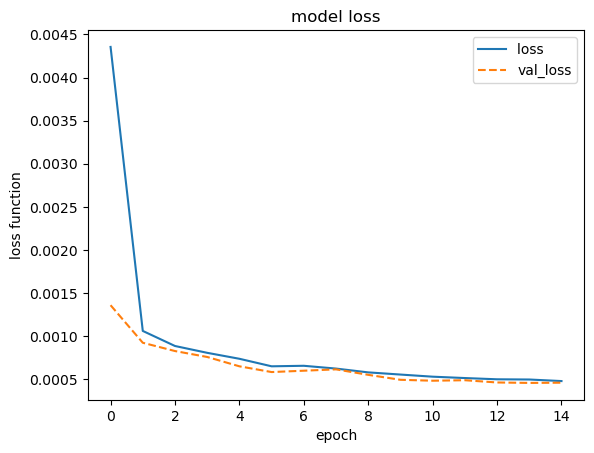

In [54]:
# plot losses to check that autoencoder is trainning correctly
plt.plot(history_cae_yy6.history['loss'])
plt.plot(history_cae_yy6.history['val_loss'],linestyle='dashed')
plt.title('model loss')
plt.ylabel('loss function')
plt.xlabel('epoch')
plt.legend(['loss ', 'val_loss' ], loc='upper right')           
plt.show()

The amin challenges of this part to try to find a good autoencoder was the huge possibility of options. I think it was a good trick us the early stop as a callback to not wast too much time but even with that the process took a long time. Some conclusions are that the batch size doesn't make a huge difference in losses but it makes the trainning slightly faster/slower. Also if you make an AE with loads of Dense layers it's going to be really time expensive and it does not necessarily mean that it's going to train better. The bigger the bottleneck the least losses but you have to be careful as a too big latent dimension is not going to do well to separate background from BSM events. 

An implementation that i found very useful was the functions I created to form an encoder and an autoencoder with different number of Dense layers and with also the possibility of changing the activation function if wanted.

# BSM evaluation between two AE 

I'm going to evaluate the both AE that I think might wor well (*cae_yy6* and *cae_paper*) ans see how they perform before evaluting the whole BSM data. For the evaluation I am going to focus on the mse value (mean squared error):

In [73]:
# this package is just so I could see how much it was taking to run the mse() function with the loop
from tqdm.notebook import tqdm

In [82]:
# computes the mse of a given processed data set for a given autoencoder
def mse (data, model):
    
    mse_val = []
    N = int(data.shape[0])
    for i in tqdm(range(0,N)):
        evalu = data[i].reshape(1,39)
        evalu2 = model.evaluate(evalu,evalu)
        mse_val.append(evalu2)
    
    return np.array(mse_val)

In [90]:
print(test.shape)
print(chacha1_scaled.shape)
print(chacha2_scaled.shape)
print(chacha3_scaled.shape)
print(chaneut1_scaled.shape)
print(chaneut2_scaled.shape)
print(z1_scaled.shape)
print(z2_scaled.shape)
print(glu1_scaled.shape)

(68054, 39)
(665, 39)
(849, 39)
(1205, 39)
(1513, 39)
(1376, 39)
(3402, 39)
(8499, 39)
(13626, 39)


For this checks I'm going to use the glu1_scaled data set as it is the one with more events and probabliy will give me a better understanding of the model performance.

In [87]:
# for the standard model test data set with the cae_yy6 model
mse_sm_yy6 = mse(test, cae_yy6)

  0%|          | 0/68054 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step - loss: 6.8073e-05 - mse: 6.8073e-05


1/1 [==============================] - 0s 32ms/step - loss: 4.7139e-04 - mse: 4.7139e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.8692e-04 - mse: 1.8692e-04


1/1 [==============================] - 0s 30ms/step - loss: 5.2760e-04 - mse: 5.2760e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.8042e-04 - mse: 2.8042e-04


1/1 [==============================] - 0s 28ms/step - loss: 7.7012e-04 - mse: 7.7012e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.1718e-04 - mse: 4.1718e-04


1/1 [==============================] - 0s 39ms/step - loss: 5.3279e-04 - mse: 5.3279e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.2267e-04 - mse: 2.2267e-04


1/1 [==============================] - 0s 36ms/step - loss: 2.0090e-04 - mse: 2.0090e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 30ms/step - loss: 2.2849e-04 - mse: 2.2849e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.5431e-04 - mse: 2.5431e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.3895e-04 - mse: 2.3895e-04


1/1 [==============================] - 0s 25ms/step - loss: 4.8964e-05 - mse: 4.8964e-05


1/1 [==============================] - 0s 31ms/step - loss: 1.9113e-04 - mse: 1.9113e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.0942e-04 - mse: 3.0942e-04


1/1 [==============================] - 0s 32ms/step - loss: 5.5506e-04 - mse: 5.5506e-04


1/1 [==============================] - 0s 32ms/step - loss: 4.4495e-04 - mse: 4.4495e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.0086e-04 - mse: 2.0086e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.4816e-04 - mse: 2.4816e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4417e-04 - mse: 1.4417e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.1606e-04 - mse: 2.1606e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.5920e-04 - mse: 1.5920e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0072 - mse: 0.0072


1/1 [==============================] - 0s 31ms/step - loss: 4.1391e-04 - mse: 4.1391e-04


1/1 [==============================] - 0s 29ms/step - loss: 3.0890e-04 - mse: 3.0890e-04


1/1 [==============================] - 0s 47ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 39ms/step - loss: 2.4137e-04 - mse: 2.4137e-04


1/1 [==============================] - 0s 84ms/step - loss: 2.9035e-04 - mse: 2.9035e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.5937e-04 - mse: 1.5937e-04


1/1 [==============================] - 0s 101ms/step - loss: 5.2642e-04 - mse: 5.2642e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.3300e-04 - mse: 4.3300e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.7868e-04 - mse: 2.7868e-04


1/1 [==============================] - 0s 184ms/step - loss: 1.5880e-04 - mse: 1.5880e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.7227e-04 - mse: 2.7227e-04


1/1 [==============================] - 0s 33ms/step - loss: 8.8263e-04 - mse: 8.8263e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.1128e-04 - mse: 2.1128e-04


1/1 [==============================] - 0s 308ms/step - loss: 1.5460e-04 - mse: 1.5460e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.0051e-04 - mse: 2.0051e-04


1/1 [==============================] - 0s 122ms/step - loss: 1.8831e-04 - mse: 1.8831e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.5571e-04 - mse: 2.5571e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.5224e-04 - mse: 2.5224e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.0935e-04 - mse: 1.0935e-04


1/1 [==============================] - 0s 29ms/step - loss: 3.4558e-04 - mse: 3.4558e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.0050e-04 - mse: 2.0050e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.2304e-04 - mse: 1.2304e-04


1/1 [==============================] - 0s 29ms/step - loss: 3.0775e-04 - mse: 3.0775e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.2262e-04 - mse: 1.2262e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.5610e-04 - mse: 2.5610e-04


1/1 [==============================] - 0s 27ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 39ms/step - loss: 6.7392e-04 - mse: 6.7392e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.3725e-04 - mse: 2.3725e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.4959e-04 - mse: 2.4959e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.8849e-04 - mse: 1.8849e-04


1/1 [==============================] - 0s 30ms/step - loss: 5.7788e-04 - mse: 5.7788e-04


1/1 [==============================] - 0s 29ms/step - loss: 4.7089e-04 - mse: 4.7089e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.3076e-04 - mse: 3.3076e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 31ms/step - loss: 4.2383e-04 - mse: 4.2383e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.1819e-04 - mse: 3.1819e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.2954e-04 - mse: 2.2954e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.0352e-04 - mse: 3.0352e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.1394e-04 - mse: 4.1394e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.3191e-04 - mse: 2.3191e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.2930e-04 - mse: 3.2930e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.2488e-04 - mse: 2.2488e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3415e-04 - mse: 1.3415e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.8514e-04 - mse: 2.8514e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.2827e-04 - mse: 2.2827e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.2924e-04 - mse: 2.2924e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.2490e-04 - mse: 1.2490e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.4398e-04 - mse: 3.4398e-04


1/1 [==============================] - 0s 38ms/step - loss: 1.8917e-04 - mse: 1.8917e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.9289e-04 - mse: 1.9289e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.8803e-04 - mse: 3.8803e-04


1/1 [==============================] - 0s 52ms/step - loss: 1.7699e-04 - mse: 1.7699e-04


1/1 [==============================] - 0s 32ms/step - loss: 6.8879e-04 - mse: 6.8879e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.9909e-04 - mse: 1.9909e-04


1/1 [==============================] - 0s 30ms/step - loss: 6.1889e-04 - mse: 6.1889e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 29ms/step - loss: 2.6674e-04 - mse: 2.6674e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.2911e-04 - mse: 2.2911e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4818e-04 - mse: 1.4818e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.0192e-04 - mse: 4.0192e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.3143e-04 - mse: 1.3143e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.9367e-04 - mse: 1.9367e-04


1/1 [==============================] - 0s 32ms/step - loss: 3.6894e-04 - mse: 3.6894e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.2146e-04 - mse: 1.2146e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0218e-04 - mse: 2.0218e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.3582e-04 - mse: 2.3582e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.1419e-04 - mse: 1.1419e-04


1/1 [==============================] - 0s 22ms/step - loss: 2.7243e-04 - mse: 2.7243e-04


1/1 [==============================] - 0s 28ms/step - loss: 2.1509e-04 - mse: 2.1509e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.9989e-04 - mse: 2.9989e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.0630e-04 - mse: 3.0630e-04


1/1 [==============================] - 0s 33ms/step - loss: 4.2573e-04 - mse: 4.2573e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.4242e-04 - mse: 2.4242e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.1957e-04 - mse: 3.1957e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.7047e-04 - mse: 2.7047e-04


1/1 [==============================] - 0s 37ms/step - loss: 1.3469e-04 - mse: 1.3469e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 30ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 30ms/step - loss: 4.5642e-04 - mse: 4.5642e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.6090e-04 - mse: 2.6090e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.3026e-04 - mse: 1.3026e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.1552e-04 - mse: 3.1552e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.5152e-04 - mse: 1.5152e-04


1/1 [==============================] - 0s 36ms/step - loss: 3.5012e-04 - mse: 3.5012e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.2052e-04 - mse: 4.2052e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 35ms/step - loss: 2.4394e-04 - mse: 2.4394e-04


1/1 [==============================] - 0s 31ms/step - loss: 5.5725e-04 - mse: 5.5725e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.2065e-04 - mse: 1.2065e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0091 - mse: 0.0091


1/1 [==============================] - 0s 33ms/step - loss: 2.5813e-04 - mse: 2.5813e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.4755e-04 - mse: 2.4755e-04


1/1 [==============================] - 0s 23ms/step - loss: 8.0427e-05 - mse: 8.0427e-05


1/1 [==============================] - 0s 30ms/step - loss: 3.3213e-04 - mse: 3.3213e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.6151e-04 - mse: 1.6151e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0994e-04 - mse: 2.0994e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.7423e-04 - mse: 2.7423e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 30ms/step - loss: 2.9824e-04 - mse: 2.9824e-04


1/1 [==============================] - 0s 35ms/step - loss: 2.2148e-04 - mse: 2.2148e-04


1/1 [==============================] - 0s 26ms/step - loss: 6.2464e-04 - mse: 6.2464e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.7519e-04 - mse: 1.7519e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.4133e-04 - mse: 4.4133e-04


1/1 [==============================] - 0s 38ms/step - loss: 1.5227e-04 - mse: 1.5227e-04


1/1 [==============================] - 0s 35ms/step - loss: 2.5473e-04 - mse: 2.5473e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.4816e-04 - mse: 3.4816e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 31ms/step - loss: 4.0117e-04 - mse: 4.0117e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.9391e-04 - mse: 2.9391e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.3260e-04 - mse: 2.3260e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.3828e-04 - mse: 4.3828e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.1990e-04 - mse: 2.1990e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.6483e-04 - mse: 2.6483e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.3900e-04 - mse: 2.3900e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.8786e-04 - mse: 1.8786e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.0807e-04 - mse: 3.0807e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.9162e-04 - mse: 1.9162e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.8381e-04 - mse: 3.8381e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 24ms/step - loss: 1.7983e-04 - mse: 1.7983e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.8382e-04 - mse: 1.8382e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.7661e-04 - mse: 1.7661e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.3025e-04 - mse: 3.3025e-04


1/1 [==============================] - 0s 42ms/step - loss: 3.6648e-04 - mse: 3.6648e-04


1/1 [==============================] - 0s 29ms/step - loss: 9.9098e-05 - mse: 9.9098e-05


1/1 [==============================] - 0s 30ms/step - loss: 2.1786e-04 - mse: 2.1786e-04


1/1 [==============================] - 0s 89ms/step - loss: 4.6268e-04 - mse: 4.6268e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.7288e-04 - mse: 1.7288e-04


1/1 [==============================] - 0s 35ms/step - loss: 4.0288e-04 - mse: 4.0288e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.1816e-04 - mse: 2.1816e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.5259e-04 - mse: 2.5259e-04


1/1 [==============================] - 0s 33ms/step - loss: 3.2726e-04 - mse: 3.2726e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.5053e-04 - mse: 1.5053e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 30ms/step - loss: 2.4563e-04 - mse: 2.4563e-04


1/1 [==============================] - 0s 58ms/step - loss: 2.7952e-04 - mse: 2.7952e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.1135e-04 - mse: 3.1135e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.2099e-04 - mse: 2.2099e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.9338e-04 - mse: 1.9338e-04


1/1 [==============================] - 0s 34ms/step - loss: 4.1486e-04 - mse: 4.1486e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.2899e-04 - mse: 4.2899e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.4132e-04 - mse: 2.4132e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.8604e-04 - mse: 4.8604e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.0285e-04 - mse: 1.0285e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.8632e-04 - mse: 1.8632e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 30ms/step - loss: 1.6301e-04 - mse: 1.6301e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.1075e-04 - mse: 1.1075e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.6061e-04 - mse: 2.6061e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.9563e-04 - mse: 1.9563e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.9063e-04 - mse: 1.9063e-04


1/1 [==============================] - 0s 27ms/step - loss: 1.7231e-04 - mse: 1.7231e-04


1/1 [==============================] - 0s 32ms/step - loss: 5.7643e-04 - mse: 5.7643e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.4689e-04 - mse: 3.4689e-04


1/1 [==============================] - 0s 34ms/step - loss: 4.2310e-04 - mse: 4.2310e-04


1/1 [==============================] - 0s 32ms/step - loss: 7.9776e-04 - mse: 7.9776e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.6737e-04 - mse: 1.6737e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.3381e-04 - mse: 2.3381e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.2649e-04 - mse: 1.2649e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.8841e-04 - mse: 2.8841e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.6066e-04 - mse: 1.6066e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.8042e-04 - mse: 1.8042e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.6068e-04 - mse: 3.6068e-04


1/1 [==============================] - 0s 27ms/step - loss: 1.5944e-04 - mse: 1.5944e-04


1/1 [==============================] - 0s 37ms/step - loss: 2.2197e-04 - mse: 2.2197e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.2419e-04 - mse: 1.2419e-04


1/1 [==============================] - 0s 32ms/step - loss: 5.5097e-04 - mse: 5.5097e-04


1/1 [==============================] - 0s 34ms/step - loss: 1.6426e-04 - mse: 1.6426e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.5378e-04 - mse: 4.5378e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.2427e-04 - mse: 2.2427e-04


1/1 [==============================] - 0s 29ms/step - loss: 3.6532e-04 - mse: 3.6532e-04


1/1 [==============================] - 0s 33ms/step - loss: 3.1337e-04 - mse: 3.1337e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.5497e-04 - mse: 4.5497e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.5553e-04 - mse: 2.5553e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.2908e-04 - mse: 2.2908e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.1497e-04 - mse: 1.1497e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.3592e-04 - mse: 2.3592e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.7610e-04 - mse: 1.7610e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.3429e-04 - mse: 1.3429e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 32ms/step - loss: 2.0996e-04 - mse: 2.0996e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.7267e-04 - mse: 1.7267e-04


1/1 [==============================] - 0s 34ms/step - loss: 3.4868e-04 - mse: 3.4868e-04


1/1 [==============================] - 0s 36ms/step - loss: 9.9391e-05 - mse: 9.9391e-05


1/1 [==============================] - 0s 32ms/step - loss: 1.6327e-04 - mse: 1.6327e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.5664e-04 - mse: 1.5664e-04


1/1 [==============================] - 0s 27ms/step - loss: 2.5004e-04 - mse: 2.5004e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.7758e-04 - mse: 1.7758e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0638e-04 - mse: 2.0638e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.4328e-04 - mse: 1.4328e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.1481e-04 - mse: 2.1481e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.7075e-04 - mse: 1.7075e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.1621e-04 - mse: 2.1621e-04


1/1 [==============================] - 0s 27ms/step - loss: 9.3990e-04 - mse: 9.3990e-04


1/1 [==============================] - 0s 37ms/step - loss: 3.0784e-04 - mse: 3.0784e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4252e-04 - mse: 1.4252e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.7815e-04 - mse: 1.7815e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.9684e-04 - mse: 2.9684e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.1904e-04 - mse: 2.1904e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0581e-04 - mse: 2.0581e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.3724e-04 - mse: 3.3724e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.4571e-04 - mse: 1.4571e-04


1/1 [==============================] - 0s 29ms/step - loss: 5.0487e-04 - mse: 5.0487e-04


1/1 [==============================] - 0s 35ms/step - loss: 3.5785e-04 - mse: 3.5785e-04


1/1 [==============================] - 0s 28ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 29ms/step - loss: 2.3780e-04 - mse: 2.3780e-04


1/1 [==============================] - 0s 32ms/step - loss: 3.1666e-04 - mse: 3.1666e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4228e-04 - mse: 1.4228e-04


1/1 [==============================] - 0s 28ms/step - loss: 1.2537e-04 - mse: 1.2537e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.7918e-04 - mse: 2.7918e-04


1/1 [==============================] - 0s 35ms/step - loss: 8.5472e-05 - mse: 8.5472e-05


1/1 [==============================] - 0s 26ms/step - loss: 3.0898e-04 - mse: 3.0898e-04


1/1 [==============================] - 0s 26ms/step - loss: 1.6863e-04 - mse: 1.6863e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.7480e-04 - mse: 1.7480e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.3114e-04 - mse: 1.3114e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3597e-04 - mse: 1.3597e-04


1/1 [==============================] - 0s 36ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 33ms/step - loss: 2.6685e-04 - mse: 2.6685e-04


1/1 [==============================] - 0s 41ms/step - loss: 1.7875e-04 - mse: 1.7875e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.8342e-04 - mse: 2.8342e-04


1/1 [==============================] - 0s 33ms/step - loss: 3.9120e-04 - mse: 3.9120e-04


1/1 [==============================] - 0s 62ms/step - loss: 1.2752e-04 - mse: 1.2752e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3650e-04 - mse: 1.3650e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.9328e-04 - mse: 2.9328e-04


1/1 [==============================] - 0s 29ms/step - loss: 7.7570e-04 - mse: 7.7570e-04


1/1 [==============================] - 0s 49ms/step - loss: 5.7850e-04 - mse: 5.7850e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.3317e-04 - mse: 3.3317e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.3332e-04 - mse: 1.3332e-04


1/1 [==============================] - 0s 44ms/step - loss: 1.4211e-04 - mse: 1.4211e-04


1/1 [==============================] - 0s 41ms/step - loss: 3.1657e-04 - mse: 3.1657e-04


1/1 [==============================] - 0s 40ms/step - loss: 2.2594e-04 - mse: 2.2594e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.6170e-04 - mse: 1.6170e-04


1/1 [==============================] - 0s 45ms/step - loss: 3.4878e-04 - mse: 3.4878e-04


1/1 [==============================] - 0s 34ms/step - loss: 3.4314e-04 - mse: 3.4314e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.3030e-04 - mse: 2.3030e-04


1/1 [==============================] - 0s 50ms/step - loss: 8.6942e-04 - mse: 8.6942e-04


1/1 [==============================] - 0s 39ms/step - loss: 1.4045e-04 - mse: 1.4045e-04


1/1 [==============================] - 0s 39ms/step - loss: 2.4195e-04 - mse: 2.4195e-04


1/1 [==============================] - 0s 65ms/step - loss: 2.9668e-04 - mse: 2.9668e-04


1/1 [==============================] - 0s 34ms/step - loss: 1.9018e-04 - mse: 1.9018e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.3847e-04 - mse: 2.3847e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 31ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 34ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 49ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 34ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 34ms/step - loss: 1.1773e-04 - mse: 1.1773e-04


1/1 [==============================] - 0s 33ms/step - loss: 5.1181e-04 - mse: 5.1181e-04


1/1 [==============================] - 0s 37ms/step - loss: 2.8752e-04 - mse: 2.8752e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.9056e-04 - mse: 1.9056e-04


1/1 [==============================] - 0s 41ms/step - loss: 8.4905e-04 - mse: 8.4905e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.4275e-04 - mse: 1.4275e-04


1/1 [==============================] - 0s 32ms/step - loss: 3.5381e-04 - mse: 3.5381e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.6970e-04 - mse: 2.6970e-04


1/1 [==============================] - 0s 35ms/step - loss: 1.9427e-04 - mse: 1.9427e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.4047e-04 - mse: 1.4047e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.5413e-04 - mse: 1.5413e-04


1/1 [==============================] - 0s 30ms/step - loss: 6.5955e-04 - mse: 6.5955e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.3738e-04 - mse: 2.3738e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.3317e-04 - mse: 2.3317e-04


1/1 [==============================] - 0s 73ms/step - loss: 2.2902e-04 - mse: 2.2902e-04


1/1 [==============================] - 0s 104ms/step - loss: 1.5028e-04 - mse: 1.5028e-04


1/1 [==============================] - 0s 38ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 32ms/step - loss: 1.8936e-04 - mse: 1.8936e-04


1/1 [==============================] - 0s 42ms/step - loss: 5.2334e-04 - mse: 5.2334e-04


1/1 [==============================] - 0s 48ms/step - loss: 8.6529e-05 - mse: 8.6529e-05


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 47ms/step - loss: 4.2874e-04 - mse: 4.2874e-04


1/1 [==============================] - 0s 95ms/step - loss: 2.5197e-04 - mse: 2.5197e-04


1/1 [==============================] - 0s 43ms/step - loss: 5.6757e-04 - mse: 5.6757e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4882e-04 - mse: 1.4882e-04


1/1 [==============================] - 0s 35ms/step - loss: 1.9661e-04 - mse: 1.9661e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.4991e-04 - mse: 1.4991e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3468e-04 - mse: 1.3468e-04


1/1 [==============================] - 0s 39ms/step - loss: 5.6513e-04 - mse: 5.6513e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.0088e-04 - mse: 1.0088e-04


1/1 [==============================] - 0s 38ms/step - loss: 3.7608e-04 - mse: 3.7608e-04


1/1 [==============================] - 0s 30ms/step - loss: 9.6172e-04 - mse: 9.6172e-04


1/1 [==============================] - 0s 39ms/step - loss: 2.3305e-04 - mse: 2.3305e-04


1/1 [==============================] - 0s 36ms/step - loss: 3.5461e-04 - mse: 3.5461e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.2510e-04 - mse: 2.2510e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.1294e-04 - mse: 2.1294e-04


1/1 [==============================] - 0s 61ms/step - loss: 1.7366e-04 - mse: 1.7366e-04


1/1 [==============================] - 0s 39ms/step - loss: 3.5878e-04 - mse: 3.5878e-04


1/1 [==============================] - 0s 105ms/step - loss: 4.1808e-04 - mse: 4.1808e-04


1/1 [==============================] - 0s 30ms/step - loss: 9.6569e-05 - mse: 9.6569e-05


1/1 [==============================] - 0s 33ms/step - loss: 1.8939e-04 - mse: 1.8939e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.1473e-04 - mse: 2.1473e-04


1/1 [==============================] - 0s 41ms/step - loss: 2.1548e-04 - mse: 2.1548e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0536e-04 - mse: 2.0536e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.4471e-04 - mse: 4.4471e-04


1/1 [==============================] - 0s 125ms/step - loss: 2.5940e-04 - mse: 2.5940e-04


1/1 [==============================] - 0s 43ms/step - loss: 3.3532e-04 - mse: 3.3532e-04


1/1 [==============================] - 0s 42ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 34ms/step - loss: 1.8469e-04 - mse: 1.8469e-04


1/1 [==============================] - 0s 35ms/step - loss: 2.9519e-04 - mse: 2.9519e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.8399e-04 - mse: 1.8399e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.8092e-04 - mse: 1.8092e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.4270e-04 - mse: 3.4270e-04


1/1 [==============================] - 0s 204ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 38ms/step - loss: 2.3290e-04 - mse: 2.3290e-04


1/1 [==============================] - 0s 27ms/step - loss: 9.0484e-04 - mse: 9.0484e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3669e-04 - mse: 1.3669e-04


1/1 [==============================] - 0s 144ms/step - loss: 3.3954e-04 - mse: 3.3954e-04


1/1 [==============================] - 0s 30ms/step - loss: 6.5791e-04 - mse: 6.5791e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.4084e-04 - mse: 1.4084e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.6350e-04 - mse: 2.6350e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4806e-04 - mse: 1.4806e-04


1/1 [==============================] - 0s 27ms/step - loss: 4.1900e-04 - mse: 4.1900e-04


1/1 [==============================] - 0s 27ms/step - loss: 6.5970e-04 - mse: 6.5970e-04


1/1 [==============================] - 0s 33ms/step - loss: 4.7090e-04 - mse: 4.7090e-04


1/1 [==============================] - 0s 49ms/step - loss: 2.2870e-04 - mse: 2.2870e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.5449e-04 - mse: 1.5449e-04


1/1 [==============================] - 0s 98ms/step - loss: 2.0948e-04 - mse: 2.0948e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.5772e-04 - mse: 1.5772e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.0562e-04 - mse: 1.0562e-04


1/1 [==============================] - 0s 37ms/step - loss: 7.2388e-04 - mse: 7.2388e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.1782e-04 - mse: 2.1782e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.1333e-04 - mse: 1.1333e-04


1/1 [==============================] - 0s 30ms/step - loss: 9.1601e-05 - mse: 9.1601e-05


1/1 [==============================] - 0s 30ms/step - loss: 1.1687e-04 - mse: 1.1687e-04


1/1 [==============================] - 0s 34ms/step - loss: 1.5783e-04 - mse: 1.5783e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.4908e-04 - mse: 2.4908e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.8036e-04 - mse: 4.8036e-04


1/1 [==============================] - 0s 28ms/step - loss: 3.0311e-04 - mse: 3.0311e-04


1/1 [==============================] - 0s 40ms/step - loss: 3.1201e-04 - mse: 3.1201e-04


1/1 [==============================] - 0s 34ms/step - loss: 1.3211e-04 - mse: 1.3211e-04


1/1 [==============================] - 0s 39ms/step - loss: 1.5525e-04 - mse: 1.5525e-04


1/1 [==============================] - 0s 28ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 30ms/step - loss: 1.2952e-04 - mse: 1.2952e-04


1/1 [==============================] - 0s 32ms/step - loss: 4.3772e-04 - mse: 4.3772e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.3400e-04 - mse: 3.3400e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.4194e-04 - mse: 2.4194e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.9404e-04 - mse: 2.9404e-04


1/1 [==============================] - 0s 40ms/step - loss: 5.6517e-05 - mse: 5.6517e-05


1/1 [==============================] - 0s 39ms/step - loss: 2.9016e-04 - mse: 2.9016e-04


1/1 [==============================] - 0s 36ms/step - loss: 2.6598e-04 - mse: 2.6598e-04


1/1 [==============================] - 0s 35ms/step - loss: 4.4161e-04 - mse: 4.4161e-04


1/1 [==============================] - 0s 31ms/step - loss: 6.0389e-04 - mse: 6.0389e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 26ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 8.9409e-05 - mse: 8.9409e-05


1/1 [==============================] - 0s 29ms/step - loss: 5.0208e-04 - mse: 5.0208e-04


1/1 [==============================] - 0s 29ms/step - loss: 5.6675e-04 - mse: 5.6675e-04


1/1 [==============================] - 0s 31ms/step - loss: 6.2009e-04 - mse: 6.2009e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.6928e-04 - mse: 1.6928e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.2716e-04 - mse: 1.2716e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.7931e-04 - mse: 2.7931e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.4146e-04 - mse: 2.4146e-04


1/1 [==============================] - 0s 66ms/step - loss: 6.0292e-04 - mse: 6.0292e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.7513e-04 - mse: 2.7513e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4674e-04 - mse: 1.4674e-04


1/1 [==============================] - 0s 34ms/step - loss: 9.6441e-05 - mse: 9.6441e-05


1/1 [==============================] - 0s 28ms/step - loss: 1.8501e-04 - mse: 1.8501e-04


1/1 [==============================] - 0s 39ms/step - loss: 8.6351e-04 - mse: 8.6351e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.6008e-04 - mse: 2.6008e-04


1/1 [==============================] - 0s 116ms/step - loss: 3.6441e-04 - mse: 3.6441e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.7371e-04 - mse: 1.7371e-04


1/1 [==============================] - 0s 32ms/step - loss: 5.5764e-04 - mse: 5.5764e-04


1/1 [==============================] - 0s 36ms/step - loss: 6.5337e-05 - mse: 6.5337e-05


1/1 [==============================] - 0s 31ms/step - loss: 2.7882e-04 - mse: 2.7882e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.7201e-04 - mse: 2.7201e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.3186e-04 - mse: 1.3186e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.2374e-04 - mse: 4.2374e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.2286e-04 - mse: 2.2286e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.7662e-04 - mse: 1.7662e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.9034e-04 - mse: 1.9034e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4258e-04 - mse: 1.4258e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.8891e-04 - mse: 2.8891e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.6114e-04 - mse: 1.6114e-04


1/1 [==============================] - 0s 30ms/step - loss: 6.3321e-04 - mse: 6.3321e-04


1/1 [==============================] - 0s 30ms/step - loss: 9.5860e-05 - mse: 9.5860e-05


1/1 [==============================] - 0s 29ms/step - loss: 2.3734e-04 - mse: 2.3734e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.6902e-04 - mse: 2.6902e-04


1/1 [==============================] - 0s 45ms/step - loss: 4.1369e-04 - mse: 4.1369e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.1127e-04 - mse: 3.1127e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.3206e-04 - mse: 1.3206e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.2820e-04 - mse: 2.2820e-04


1/1 [==============================] - 0s 29ms/step - loss: 6.6931e-05 - mse: 6.6931e-05


1/1 [==============================] - 0s 34ms/step - loss: 1.1433e-04 - mse: 1.1433e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.8697e-04 - mse: 3.8697e-04


1/1 [==============================] - 0s 56ms/step - loss: 1.8865e-04 - mse: 1.8865e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.2342e-04 - mse: 1.2342e-04


1/1 [==============================] - 0s 34ms/step - loss: 1.9878e-04 - mse: 1.9878e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.4419e-04 - mse: 2.4419e-04


1/1 [==============================] - 0s 29ms/step - loss: 9.5769e-04 - mse: 9.5769e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 43ms/step - loss: 1.1319e-04 - mse: 1.1319e-04


1/1 [==============================] - 0s 33ms/step - loss: 4.8137e-04 - mse: 4.8137e-04


1/1 [==============================] - 0s 22ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 31ms/step - loss: 2.1487e-04 - mse: 2.1487e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.4903e-04 - mse: 1.4903e-04


1/1 [==============================] - 0s 29ms/step - loss: 8.7581e-05 - mse: 8.7581e-05


1/1 [==============================] - 0s 30ms/step - loss: 1.9519e-04 - mse: 1.9519e-04


1/1 [==============================] - 0s 48ms/step - loss: 1.1106e-04 - mse: 1.1106e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.9410e-04 - mse: 3.9410e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 31ms/step - loss: 4.4425e-04 - mse: 4.4425e-04


1/1 [==============================] - 0s 31ms/step - loss: 8.4576e-05 - mse: 8.4576e-05


1/1 [==============================] - 0s 30ms/step - loss: 2.5012e-04 - mse: 2.5012e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.1367e-04 - mse: 2.1367e-04


1/1 [==============================] - 0s 48ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 29ms/step - loss: 1.3238e-04 - mse: 1.3238e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 25ms/step - loss: 5.0465e-04 - mse: 5.0465e-04


1/1 [==============================] - 0s 33ms/step - loss: 3.2680e-04 - mse: 3.2680e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.6846e-04 - mse: 1.6846e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.6949e-05 - mse: 4.6949e-05


1/1 [==============================] - 0s 31ms/step - loss: 1.7035e-04 - mse: 1.7035e-04


1/1 [==============================] - 0s 64ms/step - loss: 1.9507e-04 - mse: 1.9507e-04


1/1 [==============================] - 0s 33ms/step - loss: 8.7151e-05 - mse: 8.7151e-05


1/1 [==============================] - 0s 31ms/step - loss: 2.4181e-04 - mse: 2.4181e-04


1/1 [==============================] - 0s 32ms/step - loss: 8.2126e-04 - mse: 8.2126e-04


1/1 [==============================] - 0s 28ms/step - loss: 7.3096e-04 - mse: 7.3096e-04


1/1 [==============================] - 0s 48ms/step - loss: 2.3554e-04 - mse: 2.3554e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.8183e-04 - mse: 2.8183e-04


1/1 [==============================] - 0s 36ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 34ms/step - loss: 2.9297e-04 - mse: 2.9297e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.1730e-04 - mse: 1.1730e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.1898e-04 - mse: 2.1898e-04


1/1 [==============================] - 0s 38ms/step - loss: 1.5226e-04 - mse: 1.5226e-04


1/1 [==============================] - 0s 34ms/step - loss: 5.7269e-05 - mse: 5.7269e-05


1/1 [==============================] - 0s 73ms/step - loss: 2.2274e-04 - mse: 2.2274e-04


1/1 [==============================] - 0s 44ms/step - loss: 6.0018e-04 - mse: 6.0018e-04


1/1 [==============================] - 0s 31ms/step - loss: 9.9806e-05 - mse: 9.9806e-05


1/1 [==============================] - 0s 53ms/step - loss: 2.4034e-04 - mse: 2.4034e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.8824e-04 - mse: 2.8824e-04


1/1 [==============================] - 0s 43ms/step - loss: 1.9257e-04 - mse: 1.9257e-04


1/1 [==============================] - 0s 93ms/step - loss: 1.0590e-04 - mse: 1.0590e-04


1/1 [==============================] - 0s 54ms/step - loss: 1.9311e-04 - mse: 1.9311e-04


1/1 [==============================] - 0s 36ms/step - loss: 2.3352e-04 - mse: 2.3352e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.0007e-04 - mse: 1.0007e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.9612e-04 - mse: 3.9612e-04


1/1 [==============================] - 0s 37ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 39ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 39ms/step - loss: 3.8120e-04 - mse: 3.8120e-04


1/1 [==============================] - 0s 30ms/step - loss: 8.6342e-04 - mse: 8.6342e-04


1/1 [==============================] - 0s 30ms/step - loss: 5.5079e-04 - mse: 5.5079e-04


1/1 [==============================] - 0s 35ms/step - loss: 1.6625e-04 - mse: 1.6625e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.8830e-04 - mse: 2.8830e-04


1/1 [==============================] - 0s 32ms/step - loss: 7.5601e-05 - mse: 7.5601e-05


1/1 [==============================] - 0s 36ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 31ms/step - loss: 1.9236e-04 - mse: 1.9236e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.2517e-04 - mse: 2.2517e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.7427e-04 - mse: 1.7427e-04


1/1 [==============================] - 0s 36ms/step - loss: 2.2077e-04 - mse: 2.2077e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.6020e-04 - mse: 2.6020e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.3637e-04 - mse: 1.3637e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.5608e-04 - mse: 4.5608e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.5327e-04 - mse: 2.5327e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.6973e-04 - mse: 3.6973e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.2994e-04 - mse: 1.2994e-04


1/1 [==============================] - 0s 54ms/step - loss: 2.5373e-04 - mse: 2.5373e-04


1/1 [==============================] - 0s 51ms/step - loss: 4.0804e-04 - mse: 4.0804e-04


1/1 [==============================] - 0s 34ms/step - loss: 5.5782e-04 - mse: 5.5782e-04


1/1 [==============================] - 0s 63ms/step - loss: 2.9588e-04 - mse: 2.9588e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.2592e-04 - mse: 2.2592e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.0593e-04 - mse: 3.0593e-04


1/1 [==============================] - 0s 35ms/step - loss: 9.7854e-04 - mse: 9.7854e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.0109e-04 - mse: 3.0109e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.6865e-04 - mse: 1.6865e-04


1/1 [==============================] - 0s 31ms/step - loss: 5.1945e-04 - mse: 5.1945e-04


1/1 [==============================] - 0s 48ms/step - loss: 1.4207e-04 - mse: 1.4207e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.1969e-04 - mse: 2.1969e-04


1/1 [==============================] - 0s 41ms/step - loss: 2.3105e-04 - mse: 2.3105e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.9646e-04 - mse: 4.9646e-04


1/1 [==============================] - 0s 46ms/step - loss: 2.6351e-04 - mse: 2.6351e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.5374e-04 - mse: 1.5374e-04


1/1 [==============================] - 0s 36ms/step - loss: 3.6365e-04 - mse: 3.6365e-04


1/1 [==============================] - 0s 57ms/step - loss: 9.7007e-05 - mse: 9.7007e-05


1/1 [==============================] - 0s 30ms/step - loss: 3.7042e-04 - mse: 3.7042e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 30ms/step - loss: 1.0887e-04 - mse: 1.0887e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.2629e-04 - mse: 1.2629e-04


1/1 [==============================] - 0s 49ms/step - loss: 3.6710e-04 - mse: 3.6710e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.1956e-04 - mse: 2.1956e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.8988e-04 - mse: 3.8988e-04


1/1 [==============================] - 0s 41ms/step - loss: 5.7965e-04 - mse: 5.7965e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 121ms/step - loss: 4.4116e-04 - mse: 4.4116e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.7585e-04 - mse: 2.7585e-04


1/1 [==============================] - 0s 31ms/step - loss: 5.4297e-04 - mse: 5.4297e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.4578e-04 - mse: 4.4578e-04


1/1 [==============================] - 0s 24ms/step - loss: 3.3048e-04 - mse: 3.3048e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.7822e-04 - mse: 1.7822e-04


1/1 [==============================] - 0s 33ms/step - loss: 7.8217e-04 - mse: 7.8217e-04


1/1 [==============================] - 0s 30ms/step - loss: 6.4619e-04 - mse: 6.4619e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3596e-04 - mse: 1.3596e-04


1/1 [==============================] - 0s 36ms/step - loss: 2.7716e-04 - mse: 2.7716e-04


1/1 [==============================] - 0s 110ms/step - loss: 3.8852e-04 - mse: 3.8852e-04


1/1 [==============================] - 0s 42ms/step - loss: 1.1214e-04 - mse: 1.1214e-04


1/1 [==============================] - 0s 42ms/step - loss: 4.3271e-04 - mse: 4.3271e-04


1/1 [==============================] - 0s 47ms/step - loss: 1.6753e-04 - mse: 1.6753e-04


1/1 [==============================] - 0s 29ms/step - loss: 3.4225e-04 - mse: 3.4225e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.4292e-04 - mse: 2.4292e-04


1/1 [==============================] - 0s 35ms/step - loss: 1.4801e-04 - mse: 1.4801e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.8834e-04 - mse: 3.8834e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.4008e-04 - mse: 1.4008e-04


1/1 [==============================] - 0s 84ms/step - loss: 3.0022e-04 - mse: 3.0022e-04


1/1 [==============================] - 0s 31ms/step - loss: 4.8497e-04 - mse: 4.8497e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.9152e-04 - mse: 3.9152e-04


1/1 [==============================] - 0s 54ms/step - loss: 4.4162e-04 - mse: 4.4162e-04


1/1 [==============================] - 0s 47ms/step - loss: 2.4283e-04 - mse: 2.4283e-04


1/1 [==============================] - 0s 48ms/step - loss: 1.2148e-04 - mse: 1.2148e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.6412e-04 - mse: 1.6412e-04


1/1 [==============================] - 0s 38ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 34ms/step - loss: 3.7374e-04 - mse: 3.7374e-04


1/1 [==============================] - 0s 30ms/step - loss: 9.2056e-05 - mse: 9.2056e-05


1/1 [==============================] - 0s 30ms/step - loss: 4.5461e-04 - mse: 4.5461e-04


1/1 [==============================] - 0s 94ms/step - loss: 1.7295e-04 - mse: 1.7295e-04


1/1 [==============================] - 0s 41ms/step - loss: 9.9348e-05 - mse: 9.9348e-05


1/1 [==============================] - 0s 31ms/step - loss: 3.2333e-04 - mse: 3.2333e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.8204e-04 - mse: 1.8204e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.6389e-04 - mse: 1.6389e-04


1/1 [==============================] - 0s 345ms/step - loss: 2.7670e-04 - mse: 2.7670e-04


1/1 [==============================] - 0s 38ms/step - loss: 1.8561e-04 - mse: 1.8561e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.6615e-04 - mse: 2.6615e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.1116e-04 - mse: 3.1116e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.0892e-04 - mse: 3.0892e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 32ms/step - loss: 1.0116e-04 - mse: 1.0116e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.9097e-04 - mse: 1.9097e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.5890e-04 - mse: 1.5890e-04


1/1 [==============================] - 0s 41ms/step - loss: 1.7196e-04 - mse: 1.7196e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.3157e-04 - mse: 1.3157e-04


1/1 [==============================] - 0s 44ms/step - loss: 3.0489e-04 - mse: 3.0489e-04


1/1 [==============================] - 0s 28ms/step - loss: 1.0778e-04 - mse: 1.0778e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.2101e-04 - mse: 2.2101e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.4981e-04 - mse: 1.4981e-04


1/1 [==============================] - 0s 29ms/step - loss: 4.1767e-04 - mse: 4.1767e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.7054e-04 - mse: 3.7054e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.0983e-04 - mse: 3.0983e-04


1/1 [==============================] - 0s 44ms/step - loss: 2.2966e-04 - mse: 2.2966e-04


1/1 [==============================] - 0s 42ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 33ms/step - loss: 5.8787e-04 - mse: 5.8787e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.5221e-04 - mse: 1.5221e-04


1/1 [==============================] - 0s 43ms/step - loss: 4.6837e-04 - mse: 4.6837e-04


1/1 [==============================] - 0s 41ms/step - loss: 3.2864e-04 - mse: 3.2864e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.4327e-04 - mse: 2.4327e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.4880e-04 - mse: 1.4880e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.6296e-04 - mse: 1.6296e-04


1/1 [==============================] - 0s 32ms/step - loss: 8.9773e-05 - mse: 8.9773e-05


1/1 [==============================] - 0s 30ms/step - loss: 1.8453e-04 - mse: 1.8453e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.2415e-04 - mse: 1.2415e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.1050e-04 - mse: 3.1050e-04


1/1 [==============================] - 0s 26ms/step - loss: 4.1564e-04 - mse: 4.1564e-04


1/1 [==============================] - 0s 51ms/step - loss: 2.6696e-04 - mse: 2.6696e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 45ms/step - loss: 2.5894e-04 - mse: 2.5894e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.2141e-04 - mse: 1.2141e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.9861e-04 - mse: 2.9861e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.0848e-04 - mse: 3.0848e-04


1/1 [==============================] - 0s 36ms/step - loss: 7.4704e-04 - mse: 7.4704e-04


1/1 [==============================] - 0s 35ms/step - loss: 6.0898e-04 - mse: 6.0898e-04


1/1 [==============================] - 0s 44ms/step - loss: 2.1499e-04 - mse: 2.1499e-04


1/1 [==============================] - 0s 60ms/step - loss: 1.8261e-04 - mse: 1.8261e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.7476e-04 - mse: 1.7476e-04


1/1 [==============================] - 0s 39ms/step - loss: 2.7800e-04 - mse: 2.7800e-04


1/1 [==============================] - 0s 57ms/step - loss: 1.0912e-04 - mse: 1.0912e-04


1/1 [==============================] - 0s 38ms/step - loss: 2.9612e-04 - mse: 2.9612e-04


1/1 [==============================] - 0s 30ms/step - loss: 7.8705e-04 - mse: 7.8705e-04


1/1 [==============================] - 0s 43ms/step - loss: 4.3815e-04 - mse: 4.3815e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.4884e-04 - mse: 2.4884e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.3753e-04 - mse: 2.3753e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.4733e-04 - mse: 2.4733e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.2282e-04 - mse: 2.2282e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.6449e-04 - mse: 2.6449e-04


1/1 [==============================] - 0s 39ms/step - loss: 2.3232e-04 - mse: 2.3232e-04


1/1 [==============================] - 0s 85ms/step - loss: 5.6502e-04 - mse: 5.6502e-04


1/1 [==============================] - 0s 131ms/step - loss: 2.3413e-04 - mse: 2.3413e-04


1/1 [==============================] - 0s 37ms/step - loss: 1.6608e-04 - mse: 1.6608e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3691e-04 - mse: 1.3691e-04


1/1 [==============================] - 0s 67ms/step - loss: 2.3658e-04 - mse: 2.3658e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.2408e-04 - mse: 1.2408e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 3.7091e-04 - mse: 3.7091e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.8926e-04 - mse: 1.8926e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.0665e-04 - mse: 2.0665e-04


1/1 [==============================] - 0s 26ms/step - loss: 3.4037e-04 - mse: 3.4037e-04


1/1 [==============================] - 0s 32ms/step - loss: 5.0820e-04 - mse: 5.0820e-04


1/1 [==============================] - 0s 39ms/step - loss: 2.2974e-04 - mse: 2.2974e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.9193e-04 - mse: 2.9193e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.5792e-04 - mse: 3.5792e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.1941e-04 - mse: 2.1941e-04


1/1 [==============================] - 0s 35ms/step - loss: 2.1940e-04 - mse: 2.1940e-04


1/1 [==============================] - 0s 34ms/step - loss: 2.5474e-04 - mse: 2.5474e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.8260e-04 - mse: 1.8260e-04


1/1 [==============================] - 0s 67ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 42ms/step - loss: 2.6789e-04 - mse: 2.6789e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.8759e-04 - mse: 2.8759e-04


1/1 [==============================] - 0s 41ms/step - loss: 4.2019e-04 - mse: 4.2019e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.1273e-04 - mse: 1.1273e-04


1/1 [==============================] - 0s 62ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 41ms/step - loss: 1.6671e-04 - mse: 1.6671e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.1953e-04 - mse: 1.1953e-04


1/1 [==============================] - 0s 32ms/step - loss: 3.5054e-04 - mse: 3.5054e-04


1/1 [==============================] - 0s 40ms/step - loss: 3.5711e-04 - mse: 3.5711e-04


1/1 [==============================] - 0s 39ms/step - loss: 7.7605e-04 - mse: 7.7605e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.9506e-04 - mse: 1.9506e-04


1/1 [==============================] - 0s 39ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 33ms/step - loss: 4.8856e-04 - mse: 4.8856e-04


1/1 [==============================] - 0s 38ms/step - loss: 1.7409e-04 - mse: 1.7409e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.5355e-04 - mse: 1.5355e-04


1/1 [==============================] - 0s 36ms/step - loss: 1.9277e-04 - mse: 1.9277e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.7108e-04 - mse: 1.7108e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.6174e-04 - mse: 1.6174e-04


1/1 [==============================] - 0s 30ms/step - loss: 7.8463e-04 - mse: 7.8463e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.4814e-04 - mse: 1.4814e-04


1/1 [==============================] - 0s 36ms/step - loss: 7.7190e-05 - mse: 7.7190e-05


1/1 [==============================] - 0s 69ms/step - loss: 1.6169e-04 - mse: 1.6169e-04


1/1 [==============================] - 0s 48ms/step - loss: 2.3921e-04 - mse: 2.3921e-04


1/1 [==============================] - 0s 31ms/step - loss: 9.6523e-05 - mse: 9.6523e-05


1/1 [==============================] - 0s 33ms/step - loss: 9.0300e-04 - mse: 9.0300e-04


1/1 [==============================] - 0s 29ms/step - loss: 3.1182e-04 - mse: 3.1182e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.7019e-04 - mse: 2.7019e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.4382e-04 - mse: 1.4382e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.8808e-04 - mse: 2.8808e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.4851e-04 - mse: 1.4851e-04


1/1 [==============================] - 0s 53ms/step - loss: 3.4417e-04 - mse: 3.4417e-04


1/1 [==============================] - 0s 30ms/step - loss: 5.6636e-04 - mse: 5.6636e-04


1/1 [==============================] - 0s 33ms/step - loss: 5.0226e-04 - mse: 5.0226e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.2104e-04 - mse: 1.2104e-04


1/1 [==============================] - 0s 75ms/step - loss: 4.1069e-04 - mse: 4.1069e-04


1/1 [==============================] - 0s 36ms/step - loss: 2.9428e-04 - mse: 2.9428e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.6903e-04 - mse: 1.6903e-04


1/1 [==============================] - 0s 84ms/step - loss: 3.3912e-04 - mse: 3.3912e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 3.1968e-04 - mse: 3.1968e-04


1/1 [==============================] - 0s 38ms/step - loss: 1.5200e-04 - mse: 1.5200e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.3595e-04 - mse: 1.3595e-04


1/1 [==============================] - 0s 36ms/step - loss: 2.4257e-04 - mse: 2.4257e-04


1/1 [==============================] - 0s 46ms/step - loss: 1.7786e-04 - mse: 1.7786e-04


1/1 [==============================] - 0s 55ms/step - loss: 1.5705e-04 - mse: 1.5705e-04


1/1 [==============================] - 0s 28ms/step - loss: 3.4610e-04 - mse: 3.4610e-04


1/1 [==============================] - 0s 33ms/step - loss: 3.5189e-04 - mse: 3.5189e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.3089e-04 - mse: 1.3089e-04


1/1 [==============================] - 0s 65ms/step - loss: 2.0333e-04 - mse: 2.0333e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0792e-04 - mse: 2.0792e-04


1/1 [==============================] - 0s 35ms/step - loss: 1.5481e-04 - mse: 1.5481e-04


1/1 [==============================] - 0s 29ms/step - loss: 5.2549e-04 - mse: 5.2549e-04


1/1 [==============================] - 0s 66ms/step - loss: 1.8710e-04 - mse: 1.8710e-04


1/1 [==============================] - 0s 38ms/step - loss: 2.9438e-04 - mse: 2.9438e-04


1/1 [==============================] - 0s 36ms/step - loss: 8.8656e-04 - mse: 8.8656e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.5839e-04 - mse: 2.5839e-04


1/1 [==============================] - 0s 45ms/step - loss: 7.5431e-04 - mse: 7.5431e-04


1/1 [==============================] - 0s 31ms/step - loss: 6.6031e-04 - mse: 6.6031e-04


1/1 [==============================] - 0s 39ms/step - loss: 1.5820e-04 - mse: 1.5820e-04


1/1 [==============================] - 0s 55ms/step - loss: 2.7867e-04 - mse: 2.7867e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.9917e-04 - mse: 2.9917e-04


1/1 [==============================] - 0s 33ms/step - loss: 9.9258e-05 - mse: 9.9258e-05


1/1 [==============================] - 0s 30ms/step - loss: 9.8584e-04 - mse: 9.8584e-04


1/1 [==============================] - 0s 34ms/step - loss: 1.9407e-04 - mse: 1.9407e-04


1/1 [==============================] - 0s 64ms/step - loss: 1.8226e-04 - mse: 1.8226e-04


1/1 [==============================] - 0s 30ms/step - loss: 6.1933e-04 - mse: 6.1933e-04


1/1 [==============================] - 0s 39ms/step - loss: 2.6839e-04 - mse: 2.6839e-04


1/1 [==============================] - 0s 50ms/step - loss: 2.2997e-04 - mse: 2.2997e-04


1/1 [==============================] - 0s 45ms/step - loss: 9.0180e-04 - mse: 9.0180e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.4790e-04 - mse: 3.4790e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.2693e-04 - mse: 3.2693e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 37ms/step - loss: 2.0530e-04 - mse: 2.0530e-04


1/1 [==============================] - 0s 48ms/step - loss: 2.4392e-04 - mse: 2.4392e-04


1/1 [==============================] - 0s 29ms/step - loss: 6.3578e-04 - mse: 6.3578e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.1825e-04 - mse: 1.1825e-04


1/1 [==============================] - 0s 30ms/step - loss: 9.0313e-05 - mse: 9.0313e-05


1/1 [==============================] - 0s 40ms/step - loss: 2.5148e-04 - mse: 2.5148e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.3817e-04 - mse: 1.3817e-04


1/1 [==============================] - 0s 47ms/step - loss: 1.3863e-04 - mse: 1.3863e-04


1/1 [==============================] - 0s 80ms/step - loss: 1.7183e-04 - mse: 1.7183e-04


1/1 [==============================] - 0s 44ms/step - loss: 2.8047e-04 - mse: 2.8047e-04


1/1 [==============================] - 0s 38ms/step - loss: 5.4739e-04 - mse: 5.4739e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.1012e-04 - mse: 2.1012e-04


1/1 [==============================] - 0s 35ms/step - loss: 3.4481e-04 - mse: 3.4481e-04


1/1 [==============================] - 0s 53ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 32ms/step - loss: 2.1723e-04 - mse: 2.1723e-04


1/1 [==============================] - 0s 49ms/step - loss: 1.3196e-04 - mse: 1.3196e-04


1/1 [==============================] - 0s 35ms/step - loss: 7.6696e-04 - mse: 7.6696e-04


1/1 [==============================] - 0s 33ms/step - loss: 4.4554e-04 - mse: 4.4554e-04


1/1 [==============================] - 0s 248ms/step - loss: 1.4579e-04 - mse: 1.4579e-04


1/1 [==============================] - 0s 54ms/step - loss: 6.2988e-05 - mse: 6.2988e-05


1/1 [==============================] - 0s 30ms/step - loss: 1.5354e-04 - mse: 1.5354e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.1050e-04 - mse: 2.1050e-04


1/1 [==============================] - 0s 69ms/step - loss: 2.3660e-04 - mse: 2.3660e-04


1/1 [==============================] - 0s 70ms/step - loss: 3.2628e-04 - mse: 3.2628e-04


1/1 [==============================] - 0s 59ms/step - loss: 5.7855e-04 - mse: 5.7855e-04


1/1 [==============================] - 0s 36ms/step - loss: 3.1598e-04 - mse: 3.1598e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.4350e-04 - mse: 2.4350e-04


1/1 [==============================] - 0s 45ms/step - loss: 1.7226e-04 - mse: 1.7226e-04


1/1 [==============================] - 0s 46ms/step - loss: 1.2370e-04 - mse: 1.2370e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.4940e-04 - mse: 4.4940e-04


1/1 [==============================] - 0s 29ms/step - loss: 2.4120e-04 - mse: 2.4120e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.1442e-04 - mse: 1.1442e-04


1/1 [==============================] - 0s 45ms/step - loss: 2.1337e-04 - mse: 2.1337e-04


1/1 [==============================] - 0s 41ms/step - loss: 8.2795e-05 - mse: 8.2795e-05


1/1 [==============================] - 0s 42ms/step - loss: 8.9726e-05 - mse: 8.9726e-05


1/1 [==============================] - 0s 30ms/step - loss: 2.3473e-04 - mse: 2.3473e-04


1/1 [==============================] - 0s 43ms/step - loss: 1.7213e-04 - mse: 1.7213e-04


1/1 [==============================] - 0s 30ms/step - loss: 4.1984e-04 - mse: 4.1984e-04


1/1 [==============================] - 0s 45ms/step - loss: 1.5546e-04 - mse: 1.5546e-04


1/1 [==============================] - 0s 33ms/step - loss: 3.1987e-04 - mse: 3.1987e-04


1/1 [==============================] - 0s 33ms/step - loss: 2.0246e-04 - mse: 2.0246e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.7708e-04 - mse: 2.7708e-04


1/1 [==============================] - 0s 37ms/step - loss: 2.1961e-04 - mse: 2.1961e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0688e-04 - mse: 2.0688e-04


1/1 [==============================] - 0s 48ms/step - loss: 3.3371e-04 - mse: 3.3371e-04


1/1 [==============================] - 0s 51ms/step - loss: 1.6571e-04 - mse: 1.6571e-04


1/1 [==============================] - 0s 30ms/step - loss: 3.6609e-04 - mse: 3.6609e-04


1/1 [==============================] - 0s 30ms/step - loss: 9.3820e-04 - mse: 9.3820e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.4427e-04 - mse: 1.4427e-04


1/1 [==============================] - 0s 36ms/step - loss: 1.4178e-04 - mse: 1.4178e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.7618e-04 - mse: 2.7618e-04


1/1 [==============================] - 0s 33ms/step - loss: 5.7150e-05 - mse: 5.7150e-05


1/1 [==============================] - 0s 29ms/step - loss: 2.9098e-04 - mse: 2.9098e-04


In [92]:
# for the standard model test data set with the cae_paper model
mse_sm_paper = mse(test, cae_paper)

  0%|          | 0/68054 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 29ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 30ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 30ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 32ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 30ms/step - loss: 0.0058 - mse: 0.0058


1/1 [==============================] - 0s 30ms/step - loss: 7.3774e-04 - mse: 7.3774e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 35ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 29ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 32ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 32ms/step - loss: 5.8519e-04 - mse: 5.8519e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 33ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 30ms/step - loss: 0.0091 - mse: 0.0091


1/1 [==============================] - 0s 30ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 30ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 26ms/step - loss: 8.6479e-04 - mse: 8.6479e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0096 - mse: 0.0096


1/1 [==============================] - 0s 31ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 31ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 32ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 30ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 33ms/step - loss: 9.8412e-04 - mse: 9.8412e-04


1/1 [==============================] - 0s 28ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 32ms/step - loss: 0.0035 - mse: 0.0035


1/1 [==============================] - 0s 33ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 29ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 30ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 32ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 31ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 32ms/step - loss: 9.6257e-04 - mse: 9.6257e-04


1/1 [==============================] - 0s 35ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 30ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 30ms/step - loss: 0.0066 - mse: 0.0066


1/1 [==============================] - 0s 30ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 30ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 31ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 34ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 7.2994e-04 - mse: 7.2994e-04


1/1 [==============================] - 0s 34ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 32ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 30ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 29ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 31ms/step - loss: 0.0104 - mse: 0.0104


1/1 [==============================] - 0s 30ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 28ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 30ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 30ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 26ms/step - loss: 6.8555e-04 - mse: 6.8555e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 30ms/step - loss: 9.7631e-04 - mse: 9.7631e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 30ms/step - loss: 0.0035 - mse: 0.0035


1/1 [==============================] - 0s 31ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 32ms/step - loss: 0.0119 - mse: 0.0119


1/1 [==============================] - 0s 30ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 30ms/step - loss: 9.3339e-04 - mse: 9.3339e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 30ms/step - loss: 9.2021e-04 - mse: 9.2021e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 29ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 31ms/step - loss: 0.0111 - mse: 0.0111


1/1 [==============================] - 0s 47ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 32ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 31ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 34ms/step - loss: 0.0116 - mse: 0.0116


1/1 [==============================] - 0s 28ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 31ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 31ms/step - loss: 0.0081 - mse: 0.0081


1/1 [==============================] - 0s 32ms/step - loss: 0.0062 - mse: 0.0062


1/1 [==============================] - 0s 31ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 24ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 29ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 28ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 43ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 39ms/step - loss: 0.0058 - mse: 0.0058


1/1 [==============================] - 0s 33ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 31ms/step - loss: 0.0070 - mse: 0.0070


1/1 [==============================] - 0s 30ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 32ms/step - loss: 0.0109 - mse: 0.0109


1/1 [==============================] - 0s 29ms/step - loss: 0.0089 - mse: 0.0089


1/1 [==============================] - 0s 29ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 29ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0068 - mse: 0.0068


1/1 [==============================] - 0s 31ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 37ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 32ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 30ms/step - loss: 0.0042 - mse: 0.0042


1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 35ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 32ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 39ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 76ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 101ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 32ms/step - loss: 0.0203 - mse: 0.0203


1/1 [==============================] - 0s 29ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 52ms/step - loss: 0.0130 - mse: 0.0130


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 30ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 31ms/step - loss: 7.4752e-04 - mse: 7.4752e-04


1/1 [==============================] - 0s 26ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 32ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 28ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 32ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 30ms/step - loss: 0.0051 - mse: 0.0051


1/1 [==============================] - 0s 29ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 29ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 29ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 35ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 36ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 29ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 30ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 31ms/step - loss: 0.0035 - mse: 0.0035


1/1 [==============================] - 0s 29ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 30ms/step - loss: 9.0081e-04 - mse: 9.0081e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 32ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 29ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 31ms/step - loss: 0.0037 - mse: 0.0037


1/1 [==============================] - 0s 29ms/step - loss: 0.0089 - mse: 0.0089


1/1 [==============================] - 0s 30ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 30ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 32ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 30ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 30ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 30ms/step - loss: 6.3786e-04 - mse: 6.3786e-04


1/1 [==============================] - 0s 33ms/step - loss: 8.3150e-04 - mse: 8.3150e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 30ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 30ms/step - loss: 0.0082 - mse: 0.0082


1/1 [==============================] - 0s 30ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 26ms/step - loss: 0.0079 - mse: 0.0079


1/1 [==============================] - 0s 35ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 30ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 29ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 29ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 33ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 28ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 29ms/step - loss: 6.6751e-04 - mse: 6.6751e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 27ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 30ms/step - loss: 0.0069 - mse: 0.0069


1/1 [==============================] - 0s 31ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 30ms/step - loss: 0.0082 - mse: 0.0082


1/1 [==============================] - 0s 29ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 30ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 32ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 31ms/step - loss: 0.0063 - mse: 0.0063


1/1 [==============================] - 0s 30ms/step - loss: 0.0077 - mse: 0.0077


1/1 [==============================] - 0s 32ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 32ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 38ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 35ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 31ms/step - loss: 8.4289e-04 - mse: 8.4289e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 27ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 36ms/step - loss: 0.0086 - mse: 0.0086


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 32ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 60ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 47ms/step - loss: 0.0042 - mse: 0.0042


1/1 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 34ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 29ms/step - loss: 0.0090 - mse: 0.0090


1/1 [==============================] - 0s 44ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 31ms/step - loss: 0.0097 - mse: 0.0097


1/1 [==============================] - 0s 38ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 31ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 29ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 32ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 33ms/step - loss: 0.0075 - mse: 0.0075


1/1 [==============================] - 0s 43ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 29ms/step - loss: 0.0097 - mse: 0.0097


1/1 [==============================] - 0s 30ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 32ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 33ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 29ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 32ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 29ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 30ms/step - loss: 8.8271e-04 - mse: 8.8271e-04


1/1 [==============================] - 0s 41ms/step - loss: 0.0078 - mse: 0.0078


1/1 [==============================] - 0s 20ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 32ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 32ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 31ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 33ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 34ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 29ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 32ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 33ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 31ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 63ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 34ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 33ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 87ms/step - loss: 0.0113 - mse: 0.0113


1/1 [==============================] - 0s 31ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 31ms/step - loss: 0.0100 - mse: 0.0100


1/1 [==============================] - 0s 30ms/step - loss: 0.0037 - mse: 0.0037


1/1 [==============================] - 0s 30ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 31ms/step - loss: 0.0098 - mse: 0.0098


1/1 [==============================] - 0s 29ms/step - loss: 0.0103 - mse: 0.0103


1/1 [==============================] - 0s 30ms/step - loss: 0.0035 - mse: 0.0035


1/1 [==============================] - 0s 75ms/step - loss: 5.9054e-04 - mse: 5.9054e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 30ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 30ms/step - loss: 0.0139 - mse: 0.0139


1/1 [==============================] - 0s 33ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 32ms/step - loss: 9.2770e-04 - mse: 9.2770e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 30ms/step - loss: 0.0100 - mse: 0.0100


1/1 [==============================] - 0s 30ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 32ms/step - loss: 0.0122 - mse: 0.0122


1/1 [==============================] - 0s 31ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 27ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 31ms/step - loss: 6.0273e-04 - mse: 6.0273e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0073 - mse: 0.0073


1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 50ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 31ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 30ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 37ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 29ms/step - loss: 0.0223 - mse: 0.0223


1/1 [==============================] - 0s 36ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 31ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 29ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 31ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 31ms/step - loss: 0.0091 - mse: 0.0091


1/1 [==============================] - 0s 29ms/step - loss: 0.0106 - mse: 0.0106


1/1 [==============================] - 0s 25ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 28ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 30ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 32ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0104 - mse: 0.0104


1/1 [==============================] - 0s 33ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 36ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 31ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 30ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 30ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 35ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 32ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 38ms/step - loss: 0.0078 - mse: 0.0078


1/1 [==============================] - 0s 37ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 31ms/step - loss: 0.0099 - mse: 0.0099


1/1 [==============================] - 0s 27ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 37ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 33ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 32ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 30ms/step - loss: 0.0083 - mse: 0.0083


1/1 [==============================] - 0s 31ms/step - loss: 0.0037 - mse: 0.0037


1/1 [==============================] - 0s 34ms/step - loss: 0.0172 - mse: 0.0172


1/1 [==============================] - 0s 31ms/step - loss: 4.4410e-04 - mse: 4.4410e-04


1/1 [==============================] - 0s 58ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 74ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 31ms/step - loss: 0.0065 - mse: 0.0065


1/1 [==============================] - 0s 28ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 31ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 29ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 27ms/step - loss: 7.8357e-04 - mse: 7.8357e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 31ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 63ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 36ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 77ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 32ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 37ms/step - loss: 0.0108 - mse: 0.0108


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 64ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 46ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 49ms/step - loss: 0.0099 - mse: 0.0099


1/1 [==============================] - 0s 37ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 32ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 35ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 31ms/step - loss: 7.2323e-04 - mse: 7.2323e-04


1/1 [==============================] - 0s 30ms/step - loss: 6.4675e-04 - mse: 6.4675e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0132 - mse: 0.0132


1/1 [==============================] - 0s 33ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 33ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 31ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 51ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 43ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 30ms/step - loss: 0.0123 - mse: 0.0123


1/1 [==============================] - 0s 27ms/step - loss: 9.6940e-04 - mse: 9.6940e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 34ms/step - loss: 8.0910e-04 - mse: 8.0910e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 30ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 36ms/step - loss: 0.0063 - mse: 0.0063


1/1 [==============================] - 0s 30ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 32ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 0.0063 - mse: 0.0063


1/1 [==============================] - 0s 31ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 31ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 30ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 30ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 106ms/step - loss: 0.0095 - mse: 0.0095


1/1 [==============================] - 0s 29ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 32ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 127ms/step - loss: 0.0146 - mse: 0.0146


1/1 [==============================] - 0s 189ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 104ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 32ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 34ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 30ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 30ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 31ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 47ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 35ms/step - loss: 0.0067 - mse: 0.0067


1/1 [==============================] - 0s 30ms/step - loss: 0.0067 - mse: 0.0067


1/1 [==============================] - 0s 34ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 45ms/step - loss: 0.0322 - mse: 0.0322


1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 35ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 29ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 32ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 37ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 32ms/step - loss: 0.0207 - mse: 0.0207


1/1 [==============================] - 0s 58ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 29ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 31ms/step - loss: 0.0065 - mse: 0.0065


1/1 [==============================] - 0s 30ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 32ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 49ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 37ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 30ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 33ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 32ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 33ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 41ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 31ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 32ms/step - loss: 0.0042 - mse: 0.0042


1/1 [==============================] - 0s 32ms/step - loss: 0.0037 - mse: 0.0037


1/1 [==============================] - 0s 31ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 30ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 38ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 32ms/step - loss: 6.6361e-04 - mse: 6.6361e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 30ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 32ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 59ms/step - loss: 3.9202e-04 - mse: 3.9202e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 31ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 39ms/step - loss: 0.0052 - mse: 0.0052


1/1 [==============================] - 0s 30ms/step - loss: 0.0042 - mse: 0.0042


1/1 [==============================] - 0s 33ms/step - loss: 0.0106 - mse: 0.0106


1/1 [==============================] - 0s 43ms/step - loss: 0.0037 - mse: 0.0037


1/1 [==============================] - 0s 30ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 44ms/step - loss: 0.0067 - mse: 0.0067


1/1 [==============================] - 0s 34ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 31ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 31ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 38ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 32ms/step - loss: 0.0062 - mse: 0.0062


1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 30ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 40ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 57ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 31ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 36ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 30ms/step - loss: 0.0085 - mse: 0.0085


1/1 [==============================] - 0s 32ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 37ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 30ms/step - loss: 6.8595e-04 - mse: 6.8595e-04


1/1 [==============================] - 0s 38ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 48ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 32ms/step - loss: 9.6289e-04 - mse: 9.6289e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 31ms/step - loss: 0.0113 - mse: 0.0113


1/1 [==============================] - 0s 104ms/step - loss: 0.0087 - mse: 0.0087


1/1 [==============================] - 0s 32ms/step - loss: 8.6757e-04 - mse: 8.6757e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0068 - mse: 0.0068


1/1 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 9.3200e-04 - mse: 9.3200e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 32ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 30ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 40ms/step - loss: 3.7382e-04 - mse: 3.7382e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 41ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 32ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 32ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 29ms/step - loss: 0.0131 - mse: 0.0131


1/1 [==============================] - 0s 31ms/step - loss: 0.0067 - mse: 0.0067


1/1 [==============================] - 0s 31ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 40ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 33ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 41ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 123ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 32ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 32ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 36ms/step - loss: 0.0073 - mse: 0.0073


1/1 [==============================] - 0s 32ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 30ms/step - loss: 0.0079 - mse: 0.0079


1/1 [==============================] - 0s 33ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 29ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 37ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 31ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 32ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 47ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 31ms/step - loss: 0.0242 - mse: 0.0242


1/1 [==============================] - 0s 32ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 30ms/step - loss: 0.0074 - mse: 0.0074


1/1 [==============================] - 0s 30ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 30ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 27ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 30ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 31ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 30ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 31ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0067 - mse: 0.0067


1/1 [==============================] - 0s 30ms/step - loss: 0.0092 - mse: 0.0092


1/1 [==============================] - 0s 101ms/step - loss: 6.2878e-04 - mse: 6.2878e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 30ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 29ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 29ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 25ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 32ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 31ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 35ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 39ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 42ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 29ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 44ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 27ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 29ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 37ms/step - loss: 0.0051 - mse: 0.0051


1/1 [==============================] - 0s 34ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 30ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 30ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 30ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 32ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 38ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 8.3413e-04 - mse: 8.3413e-04


1/1 [==============================] - 0s 34ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 31ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 28ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 28ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 31ms/step - loss: 0.0190 - mse: 0.0190


1/1 [==============================] - 0s 62ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 33ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 34ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 35ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 30ms/step - loss: 0.0104 - mse: 0.0104


1/1 [==============================] - 0s 31ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 0.0066 - mse: 0.0066


1/1 [==============================] - 0s 33ms/step - loss: 0.0052 - mse: 0.0052


1/1 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 43ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 40ms/step - loss: 0.0052 - mse: 0.0052


1/1 [==============================] - 0s 39ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 83ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 31ms/step - loss: 0.0139 - mse: 0.0139


1/1 [==============================] - 0s 43ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 7.8900e-04 - mse: 7.8900e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 30ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 31ms/step - loss: 9.8341e-04 - mse: 9.8341e-04


1/1 [==============================] - 0s 94ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 32ms/step - loss: 6.5852e-04 - mse: 6.5852e-04


1/1 [==============================] - 0s 64ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 30ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 39ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 41ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 30ms/step - loss: 0.0042 - mse: 0.0042


1/1 [==============================] - 0s 30ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 33ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 30ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 49ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 29ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 33ms/step - loss: 7.4438e-04 - mse: 7.4438e-04


1/1 [==============================] - 0s 39ms/step - loss: 0.0129 - mse: 0.0129


1/1 [==============================] - 0s 41ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 33ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 32ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 52ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 40ms/step - loss: 9.8726e-04 - mse: 9.8726e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 43ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 42ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 53ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 54ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 50ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 32ms/step - loss: 0.0070 - mse: 0.0070


1/1 [==============================] - 0s 39ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 33ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 46ms/step - loss: 0.0171 - mse: 0.0171


1/1 [==============================] - 0s 41ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 29ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 37ms/step - loss: 4.5191e-04 - mse: 4.5191e-04


1/1 [==============================] - 0s 91ms/step - loss: 0.0058 - mse: 0.0058


1/1 [==============================] - 0s 30ms/step - loss: 9.1950e-04 - mse: 9.1950e-04


1/1 [==============================] - 0s 28ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 33ms/step - loss: 0.0082 - mse: 0.0082


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 32ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0207 - mse: 0.0207


1/1 [==============================] - 0s 46ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 29ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 30ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 30ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 30ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 32ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 36ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 32ms/step - loss: 0.0241 - mse: 0.0241


1/1 [==============================] - 0s 31ms/step - loss: 0.0157 - mse: 0.0157


1/1 [==============================] - 0s 34ms/step - loss: 0.0085 - mse: 0.0085


1/1 [==============================] - 0s 52ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 31ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 36ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 42ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 54ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 49ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 32ms/step - loss: 0.0161 - mse: 0.0161


1/1 [==============================] - 0s 64ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 35ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 35ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 38ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 30ms/step - loss: 8.2990e-04 - mse: 8.2990e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 35ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 30ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 50ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 37ms/step - loss: 0.0062 - mse: 0.0062


1/1 [==============================] - 0s 159ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 33ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 29ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 36ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 33ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0082 - mse: 0.0082


1/1 [==============================] - 0s 31ms/step - loss: 0.0248 - mse: 0.0248


1/1 [==============================] - 0s 32ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0035 - mse: 0.0035


1/1 [==============================] - 0s 31ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 39ms/step - loss: 0.0089 - mse: 0.0089


1/1 [==============================] - 0s 31ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 34ms/step - loss: 6.2509e-04 - mse: 6.2509e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 32ms/step - loss: 0.0075 - mse: 0.0075


1/1 [==============================] - 0s 31ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 33ms/step - loss: 0.0115 - mse: 0.0115


1/1 [==============================] - 0s 30ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 33ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 31ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 35ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 35ms/step - loss: 5.4658e-04 - mse: 5.4658e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 29ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 31ms/step - loss: 0.0154 - mse: 0.0154


1/1 [==============================] - 0s 54ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 30ms/step - loss: 9.9665e-04 - mse: 9.9665e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 41ms/step - loss: 0.0116 - mse: 0.0116


1/1 [==============================] - 0s 42ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 33ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 50ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 27ms/step - loss: 0.0119 - mse: 0.0119


1/1 [==============================] - 0s 105ms/step - loss: 7.0575e-04 - mse: 7.0575e-04


1/1 [==============================] - 0s 40ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 31ms/step - loss: 6.9183e-04 - mse: 6.9183e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0072 - mse: 0.0072


1/1 [==============================] - 0s 28ms/step - loss: 0.0071 - mse: 0.0071


1/1 [==============================] - 0s 34ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 31ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 32ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 30ms/step - loss: 0.0084 - mse: 0.0084


1/1 [==============================] - 0s 40ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 32ms/step - loss: 0.0096 - mse: 0.0096


1/1 [==============================] - 0s 31ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 54ms/step - loss: 0.0116 - mse: 0.0116


1/1 [==============================] - 0s 33ms/step - loss: 0.0070 - mse: 0.0070


1/1 [==============================] - 0s 46ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 29ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 32ms/step - loss: 0.0053 - mse: 0.0053


1/1 [==============================] - 0s 36ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 30ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 29ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 37ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 47ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 32ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 31ms/step - loss: 0.0109 - mse: 0.0109


1/1 [==============================] - 0s 31ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 29ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 48ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 36ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 29ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 31ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 34ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 30ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 40ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 41ms/step - loss: 0.0086 - mse: 0.0086


1/1 [==============================] - 0s 39ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 42ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 34ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 32ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 31ms/step - loss: 9.7873e-04 - mse: 9.7873e-04


1/1 [==============================] - 0s 50ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 32ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 32ms/step - loss: 0.0052 - mse: 0.0052


1/1 [==============================] - 0s 32ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 35ms/step - loss: 0.0058 - mse: 0.0058


1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 39ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 31ms/step - loss: 0.0094 - mse: 0.0094


1/1 [==============================] - 0s 32ms/step - loss: 0.0107 - mse: 0.0107


1/1 [==============================] - 0s 69ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 0.0065 - mse: 0.0065


1/1 [==============================] - 0s 26ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 40ms/step - loss: 8.4636e-04 - mse: 8.4636e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 100ms/step - loss: 0.0035 - mse: 0.0035


1/1 [==============================] - 0s 56ms/step - loss: 0.0126 - mse: 0.0126


1/1 [==============================] - 0s 32ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 31ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 30ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 40ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 61ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 33ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 29ms/step - loss: 0.0029 - mse: 0.0029


In [93]:
mse_glu1_yy6 = mse(glu1_scaled, cae_yy6)

  0%|          | 0/13626 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 32ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 28ms/step - loss: 0.0380 - mse: 0.0380


1/1 [==============================] - 0s 31ms/step - loss: 0.0068 - mse: 0.0068


1/1 [==============================] - 0s 29ms/step - loss: 0.0127 - mse: 0.0127


1/1 [==============================] - 0s 31ms/step - loss: 5.8718e-04 - mse: 5.8718e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 33ms/step - loss: 0.0230 - mse: 0.0230


1/1 [==============================] - 0s 32ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 31ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 29ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 31ms/step - loss: 0.0160 - mse: 0.0160


1/1 [==============================] - 0s 31ms/step - loss: 0.0094 - mse: 0.0094


1/1 [==============================] - 0s 30ms/step - loss: 0.0065 - mse: 0.0065


1/1 [==============================] - 0s 30ms/step - loss: 0.0072 - mse: 0.0072


1/1 [==============================] - 0s 31ms/step - loss: 0.0092 - mse: 0.0092


1/1 [==============================] - 0s 31ms/step - loss: 6.8286e-04 - mse: 6.8286e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0075 - mse: 0.0075


1/1 [==============================] - 0s 31ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 31ms/step - loss: 0.0156 - mse: 0.0156


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 29ms/step - loss: 0.0262 - mse: 0.0262


1/1 [==============================] - 0s 31ms/step - loss: 0.0071 - mse: 0.0071


1/1 [==============================] - 0s 31ms/step - loss: 0.0066 - mse: 0.0066


1/1 [==============================] - 0s 30ms/step - loss: 0.0224 - mse: 0.0224


1/1 [==============================] - 0s 33ms/step - loss: 0.0062 - mse: 0.0062


1/1 [==============================] - 0s 32ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 34ms/step - loss: 0.0238 - mse: 0.0238


1/1 [==============================] - 0s 28ms/step - loss: 9.8395e-04 - mse: 9.8395e-04


1/1 [==============================] - 0s 30ms/step - loss: 7.9012e-04 - mse: 7.9012e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 31ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 32ms/step - loss: 0.0086 - mse: 0.0086


1/1 [==============================] - 0s 31ms/step - loss: 5.8220e-04 - mse: 5.8220e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0037 - mse: 0.0037


1/1 [==============================] - 0s 31ms/step - loss: 0.0058 - mse: 0.0058


1/1 [==============================] - 0s 30ms/step - loss: 0.0136 - mse: 0.0136


1/1 [==============================] - 0s 31ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 39ms/step - loss: 0.0401 - mse: 0.0401


1/1 [==============================] - 0s 31ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 30ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 30ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 37ms/step - loss: 7.4210e-04 - mse: 7.4210e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 37ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 35ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 30ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 30ms/step - loss: 0.0104 - mse: 0.0104


1/1 [==============================] - 0s 31ms/step - loss: 0.0726 - mse: 0.0726


1/1 [==============================] - 0s 30ms/step - loss: 0.0571 - mse: 0.0571


1/1 [==============================] - 0s 29ms/step - loss: 0.0038 - mse: 0.0038


1/1 [==============================] - 0s 33ms/step - loss: 0.0102 - mse: 0.0102


1/1 [==============================] - 0s 31ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 28ms/step - loss: 0.0082 - mse: 0.0082


1/1 [==============================] - 0s 30ms/step - loss: 9.5615e-04 - mse: 9.5615e-04


1/1 [==============================] - 0s 27ms/step - loss: 0.0084 - mse: 0.0084


1/1 [==============================] - 0s 33ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 36ms/step - loss: 0.0092 - mse: 0.0092


1/1 [==============================] - 0s 30ms/step - loss: 0.0233 - mse: 0.0233


1/1 [==============================] - 0s 31ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 33ms/step - loss: 0.0050 - mse: 0.0050


1/1 [==============================] - 0s 30ms/step - loss: 0.0333 - mse: 0.0333


1/1 [==============================] - 0s 30ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 32ms/step - loss: 0.0108 - mse: 0.0108


1/1 [==============================] - 0s 30ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 31ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 33ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 39ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 29ms/step - loss: 0.0281 - mse: 0.0281


1/1 [==============================] - 0s 28ms/step - loss: 0.0060 - mse: 0.0060


1/1 [==============================] - 0s 30ms/step - loss: 0.0342 - mse: 0.0342


1/1 [==============================] - 0s 29ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 35ms/step - loss: 0.0106 - mse: 0.0106


1/1 [==============================] - 0s 31ms/step - loss: 0.0116 - mse: 0.0116


1/1 [==============================] - 0s 31ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 31ms/step - loss: 0.0052 - mse: 0.0052


1/1 [==============================] - 0s 31ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 31ms/step - loss: 0.0116 - mse: 0.0116


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 31ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 30ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 30ms/step - loss: 7.7505e-04 - mse: 7.7505e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0581 - mse: 0.0581


1/1 [==============================] - 0s 30ms/step - loss: 0.0074 - mse: 0.0074


1/1 [==============================] - 0s 31ms/step - loss: 0.0259 - mse: 0.0259


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 30ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 30ms/step - loss: 0.0063 - mse: 0.0063


1/1 [==============================] - 0s 31ms/step - loss: 0.0442 - mse: 0.0442


1/1 [==============================] - 0s 31ms/step - loss: 0.0233 - mse: 0.0233


1/1 [==============================] - 0s 24ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 30ms/step - loss: 6.1312e-04 - mse: 6.1312e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 32ms/step - loss: 0.0025 - mse: 0.0025


1/1 [==============================] - 0s 32ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 30ms/step - loss: 0.0076 - mse: 0.0076


1/1 [==============================] - 0s 41ms/step - loss: 0.0140 - mse: 0.0140


1/1 [==============================] - 0s 28ms/step - loss: 0.0051 - mse: 0.0051


1/1 [==============================] - 0s 41ms/step - loss: 0.0472 - mse: 0.0472


1/1 [==============================] - 0s 30ms/step - loss: 0.0107 - mse: 0.0107


1/1 [==============================] - 0s 41ms/step - loss: 0.0098 - mse: 0.0098


1/1 [==============================] - 0s 30ms/step - loss: 0.0118 - mse: 0.0118


1/1 [==============================] - 0s 30ms/step - loss: 8.3800e-04 - mse: 8.3800e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 30ms/step - loss: 0.0080 - mse: 0.0080


1/1 [==============================] - 0s 32ms/step - loss: 0.0062 - mse: 0.0062


1/1 [==============================] - 0s 28ms/step - loss: 0.0169 - mse: 0.0169


1/1 [==============================] - 0s 30ms/step - loss: 0.0146 - mse: 0.0146


1/1 [==============================] - 0s 30ms/step - loss: 0.0103 - mse: 0.0103


1/1 [==============================] - 0s 46ms/step - loss: 0.0248 - mse: 0.0248


1/1 [==============================] - 0s 34ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 31ms/step - loss: 0.0071 - mse: 0.0071


1/1 [==============================] - 0s 32ms/step - loss: 6.1886e-04 - mse: 6.1886e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 30ms/step - loss: 0.0177 - mse: 0.0177


1/1 [==============================] - 0s 30ms/step - loss: 0.0084 - mse: 0.0084


1/1 [==============================] - 0s 32ms/step - loss: 0.0092 - mse: 0.0092


1/1 [==============================] - 0s 30ms/step - loss: 0.0240 - mse: 0.0240


1/1 [==============================] - 0s 30ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 30ms/step - loss: 0.0037 - mse: 0.0037


1/1 [==============================] - 0s 31ms/step - loss: 5.2463e-04 - mse: 5.2463e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0086 - mse: 0.0086


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0075 - mse: 0.0075


1/1 [==============================] - 0s 32ms/step - loss: 0.0049 - mse: 0.0049


1/1 [==============================] - 0s 53ms/step - loss: 0.0102 - mse: 0.0102


1/1 [==============================] - 0s 33ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 29ms/step - loss: 0.0448 - mse: 0.0448


1/1 [==============================] - 0s 30ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 33ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 104ms/step - loss: 2.6137e-04 - mse: 2.6137e-04


In [94]:
mse_glu1_paper = mse(glu1_scaled, cae_paper)

  0%|          | 0/13626 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step - loss: 0.0216 - mse: 0.0216


1/1 [==============================] - 0s 29ms/step - loss: 0.0529 - mse: 0.0529


1/1 [==============================] - 0s 31ms/step - loss: 0.0310 - mse: 0.0310


1/1 [==============================] - 0s 31ms/step - loss: 0.0289 - mse: 0.0289


1/1 [==============================] - 0s 28ms/step - loss: 0.0392 - mse: 0.0392


1/1 [==============================] - 0s 30ms/step - loss: 0.0570 - mse: 0.0570


1/1 [==============================] - 0s 31ms/step - loss: 0.0304 - mse: 0.0304


1/1 [==============================] - 0s 32ms/step - loss: 0.0861 - mse: 0.0861


1/1 [==============================] - 0s 29ms/step - loss: 0.0246 - mse: 0.0246


1/1 [==============================] - 0s 30ms/step - loss: 0.0416 - mse: 0.0416


1/1 [==============================] - 0s 30ms/step - loss: 0.0603 - mse: 0.0603


1/1 [==============================] - 0s 30ms/step - loss: 0.0313 - mse: 0.0313


1/1 [==============================] - 0s 30ms/step - loss: 0.0229 - mse: 0.0229


1/1 [==============================] - 0s 30ms/step - loss: 0.0115 - mse: 0.0115


1/1 [==============================] - 0s 31ms/step - loss: 0.0613 - mse: 0.0613


1/1 [==============================] - 0s 32ms/step - loss: 0.0104 - mse: 0.0104


1/1 [==============================] - 0s 58ms/step - loss: 0.0217 - mse: 0.0217


1/1 [==============================] - 0s 29ms/step - loss: 0.0292 - mse: 0.0292


1/1 [==============================] - 0s 35ms/step - loss: 0.0372 - mse: 0.0372


1/1 [==============================] - 0s 29ms/step - loss: 0.0172 - mse: 0.0172


1/1 [==============================] - 0s 29ms/step - loss: 0.0180 - mse: 0.0180


1/1 [==============================] - 0s 29ms/step - loss: 0.0373 - mse: 0.0373


1/1 [==============================] - 0s 29ms/step - loss: 0.0218 - mse: 0.0218


1/1 [==============================] - 0s 31ms/step - loss: 0.0525 - mse: 0.0525


1/1 [==============================] - 0s 33ms/step - loss: 0.0227 - mse: 0.0227


1/1 [==============================] - 0s 31ms/step - loss: 0.0258 - mse: 0.0258


1/1 [==============================] - 0s 33ms/step - loss: 0.0790 - mse: 0.0790


1/1 [==============================] - 0s 40ms/step - loss: 0.0333 - mse: 0.0333


1/1 [==============================] - 0s 32ms/step - loss: 0.0176 - mse: 0.0176


1/1 [==============================] - 0s 32ms/step - loss: 0.0743 - mse: 0.0743


1/1 [==============================] - 0s 30ms/step - loss: 0.0291 - mse: 0.0291


1/1 [==============================] - 0s 91ms/step - loss: 0.0602 - mse: 0.0602


1/1 [==============================] - 0s 46ms/step - loss: 0.0500 - mse: 0.0500


1/1 [==============================] - 0s 30ms/step - loss: 0.0359 - mse: 0.0359


1/1 [==============================] - 0s 31ms/step - loss: 0.0313 - mse: 0.0313


1/1 [==============================] - 0s 32ms/step - loss: 0.0513 - mse: 0.0513


1/1 [==============================] - 0s 39ms/step - loss: 0.1071 - mse: 0.1071


1/1 [==============================] - 0s 32ms/step - loss: 0.0825 - mse: 0.0825


1/1 [==============================] - 0s 30ms/step - loss: 0.0923 - mse: 0.0923


1/1 [==============================] - 0s 30ms/step - loss: 0.0462 - mse: 0.0462


1/1 [==============================] - 0s 30ms/step - loss: 0.0249 - mse: 0.0249


1/1 [==============================] - 0s 32ms/step - loss: 0.1005 - mse: 0.1005


1/1 [==============================] - 0s 30ms/step - loss: 0.0773 - mse: 0.0773


1/1 [==============================] - 0s 30ms/step - loss: 0.0338 - mse: 0.0338


1/1 [==============================] - 0s 30ms/step - loss: 0.0333 - mse: 0.0333


1/1 [==============================] - 0s 32ms/step - loss: 0.0369 - mse: 0.0369


1/1 [==============================] - 0s 30ms/step - loss: 0.0187 - mse: 0.0187


1/1 [==============================] - 0s 35ms/step - loss: 0.0123 - mse: 0.0123


1/1 [==============================] - 0s 41ms/step - loss: 0.0378 - mse: 0.0378


1/1 [==============================] - 0s 33ms/step - loss: 0.0404 - mse: 0.0404


1/1 [==============================] - 0s 31ms/step - loss: 0.0371 - mse: 0.0371


1/1 [==============================] - 0s 31ms/step - loss: 0.0741 - mse: 0.0741


1/1 [==============================] - 0s 29ms/step - loss: 0.0185 - mse: 0.0185


1/1 [==============================] - 0s 26ms/step - loss: 0.0288 - mse: 0.0288


1/1 [==============================] - 0s 66ms/step - loss: 0.0222 - mse: 0.0222


1/1 [==============================] - 0s 30ms/step - loss: 0.0182 - mse: 0.0182


1/1 [==============================] - 0s 30ms/step - loss: 0.0513 - mse: 0.0513


1/1 [==============================] - 0s 30ms/step - loss: 0.0534 - mse: 0.0534


1/1 [==============================] - 0s 31ms/step - loss: 0.0373 - mse: 0.0373


1/1 [==============================] - 0s 31ms/step - loss: 0.0150 - mse: 0.0150


1/1 [==============================] - 0s 31ms/step - loss: 0.0251 - mse: 0.0251


1/1 [==============================] - 0s 30ms/step - loss: 0.0260 - mse: 0.0260


1/1 [==============================] - 0s 31ms/step - loss: 0.0210 - mse: 0.0210


1/1 [==============================] - 0s 30ms/step - loss: 0.0305 - mse: 0.0305


1/1 [==============================] - 0s 31ms/step - loss: 0.0248 - mse: 0.0248


1/1 [==============================] - 0s 31ms/step - loss: 0.0659 - mse: 0.0659


1/1 [==============================] - 0s 34ms/step - loss: 0.0361 - mse: 0.0361


1/1 [==============================] - 0s 31ms/step - loss: 0.0357 - mse: 0.0357


1/1 [==============================] - 0s 89ms/step - loss: 0.0233 - mse: 0.0233


1/1 [==============================] - 0s 31ms/step - loss: 0.0283 - mse: 0.0283


1/1 [==============================] - 0s 37ms/step - loss: 0.0695 - mse: 0.0695


1/1 [==============================] - 0s 64ms/step - loss: 0.0335 - mse: 0.0335


1/1 [==============================] - 0s 31ms/step - loss: 0.0249 - mse: 0.0249


1/1 [==============================] - 0s 35ms/step - loss: 0.0421 - mse: 0.0421


1/1 [==============================] - 0s 31ms/step - loss: 0.0397 - mse: 0.0397


1/1 [==============================] - 0s 29ms/step - loss: 0.0433 - mse: 0.0433


1/1 [==============================] - 0s 23ms/step - loss: 0.0237 - mse: 0.0237


1/1 [==============================] - 0s 32ms/step - loss: 0.1158 - mse: 0.1158


1/1 [==============================] - 0s 31ms/step - loss: 0.0513 - mse: 0.0513


1/1 [==============================] - 0s 36ms/step - loss: 0.0287 - mse: 0.0287


1/1 [==============================] - 0s 31ms/step - loss: 0.0340 - mse: 0.0340


1/1 [==============================] - 0s 30ms/step - loss: 0.0212 - mse: 0.0212


1/1 [==============================] - 0s 27ms/step - loss: 0.0415 - mse: 0.0415


1/1 [==============================] - 0s 31ms/step - loss: 0.0896 - mse: 0.0896


1/1 [==============================] - 0s 27ms/step - loss: 0.0349 - mse: 0.0349


1/1 [==============================] - 0s 32ms/step - loss: 0.0530 - mse: 0.0530


1/1 [==============================] - 0s 169ms/step - loss: 0.0139 - mse: 0.0139


1/1 [==============================] - 0s 30ms/step - loss: 0.0245 - mse: 0.0245


1/1 [==============================] - 0s 30ms/step - loss: 0.0181 - mse: 0.0181


1/1 [==============================] - 0s 31ms/step - loss: 0.0516 - mse: 0.0516


1/1 [==============================] - 0s 31ms/step - loss: 0.0697 - mse: 0.0697


1/1 [==============================] - 0s 39ms/step - loss: 0.0188 - mse: 0.0188


1/1 [==============================] - 0s 30ms/step - loss: 0.0177 - mse: 0.0177


1/1 [==============================] - 0s 30ms/step - loss: 0.0270 - mse: 0.0270


1/1 [==============================] - 0s 31ms/step - loss: 0.0528 - mse: 0.0528


1/1 [==============================] - 0s 33ms/step - loss: 0.0300 - mse: 0.0300


1/1 [==============================] - 0s 32ms/step - loss: 0.0618 - mse: 0.0618


1/1 [==============================] - 0s 29ms/step - loss: 0.0500 - mse: 0.0500


1/1 [==============================] - 0s 31ms/step - loss: 0.0853 - mse: 0.0853


1/1 [==============================] - 0s 31ms/step - loss: 0.0355 - mse: 0.0355


1/1 [==============================] - 0s 31ms/step - loss: 0.0173 - mse: 0.0173


1/1 [==============================] - 0s 33ms/step - loss: 0.0405 - mse: 0.0405


1/1 [==============================] - 0s 31ms/step - loss: 0.0264 - mse: 0.0264


1/1 [==============================] - 0s 38ms/step - loss: 0.0208 - mse: 0.0208


1/1 [==============================] - 0s 38ms/step - loss: 0.0228 - mse: 0.0228


1/1 [==============================] - 0s 30ms/step - loss: 0.1467 - mse: 0.1467


1/1 [==============================] - 0s 32ms/step - loss: 0.0210 - mse: 0.0210


1/1 [==============================] - 0s 31ms/step - loss: 0.0211 - mse: 0.0211


1/1 [==============================] - 0s 31ms/step - loss: 0.0257 - mse: 0.0257


1/1 [==============================] - 0s 32ms/step - loss: 0.0267 - mse: 0.0267


1/1 [==============================] - 0s 30ms/step - loss: 0.0304 - mse: 0.0304


1/1 [==============================] - 0s 37ms/step - loss: 0.0729 - mse: 0.0729


1/1 [==============================] - 0s 34ms/step - loss: 0.0244 - mse: 0.0244


1/1 [==============================] - 0s 30ms/step - loss: 0.0384 - mse: 0.0384


1/1 [==============================] - 0s 31ms/step - loss: 0.0529 - mse: 0.0529


1/1 [==============================] - 0s 51ms/step - loss: 0.0480 - mse: 0.0480


1/1 [==============================] - 0s 30ms/step - loss: 0.0217 - mse: 0.0217


1/1 [==============================] - 0s 31ms/step - loss: 0.0136 - mse: 0.0136


1/1 [==============================] - 0s 31ms/step - loss: 0.0219 - mse: 0.0219


1/1 [==============================] - 0s 32ms/step - loss: 0.0270 - mse: 0.0270


1/1 [==============================] - 0s 29ms/step - loss: 0.0723 - mse: 0.0723


1/1 [==============================] - 0s 27ms/step - loss: 0.0215 - mse: 0.0215


1/1 [==============================] - 0s 34ms/step - loss: 0.0189 - mse: 0.0189


1/1 [==============================] - 0s 30ms/step - loss: 0.0508 - mse: 0.0508


1/1 [==============================] - 0s 30ms/step - loss: 0.0224 - mse: 0.0224


1/1 [==============================] - 0s 36ms/step - loss: 0.0291 - mse: 0.0291


1/1 [==============================] - 0s 31ms/step - loss: 0.0332 - mse: 0.0332


1/1 [==============================] - 0s 31ms/step - loss: 0.0379 - mse: 0.0379


1/1 [==============================] - 0s 30ms/step - loss: 0.0397 - mse: 0.0397


1/1 [==============================] - 0s 34ms/step - loss: 0.0191 - mse: 0.0191


1/1 [==============================] - 0s 28ms/step - loss: 0.0369 - mse: 0.0369


1/1 [==============================] - 0s 30ms/step - loss: 0.0092 - mse: 0.0092


1/1 [==============================] - 0s 30ms/step - loss: 0.0450 - mse: 0.0450


1/1 [==============================] - 0s 30ms/step - loss: 0.0284 - mse: 0.0284


1/1 [==============================] - 0s 34ms/step - loss: 0.0294 - mse: 0.0294


In [126]:
# for the histograms
kwargs = dict(histtype='stepfilled', alpha=0.8)

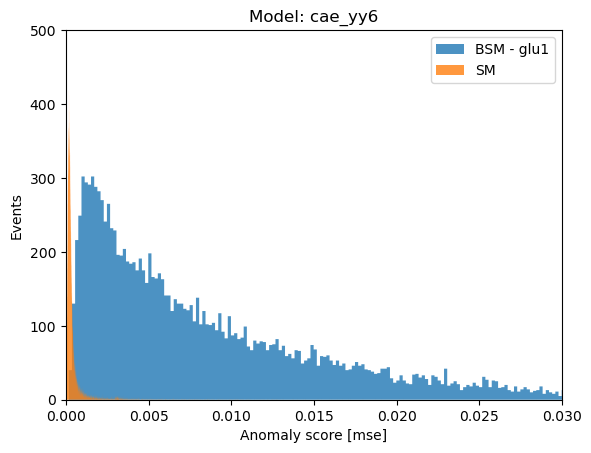

In [206]:
plt.hist(mse_glu1_yy6[:,0], bins = 1000, label = "BSM - glu1", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 25000, label = "SM" , **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,500])
plt.xlim([0, 0.03])
plt.show();

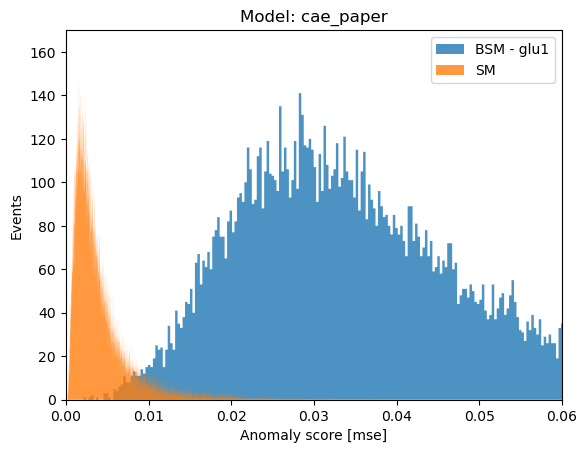

In [130]:
plt.hist(mse_glu1_paper[:,0], bins = 1000, label = "BSM - glu1", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 10000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,170])
plt.xlim([0, 0.06])
plt.show();

The *cae_paper* model seems to be working a bit better at least to separate the BSM data from teh SM for this data set so I'm going to do one more check with another data set from that just decide on one to do the full evaluation and discussion.

In [106]:
mse_z2_yy6 = mse(z2_scaled, cae_yy6)

  0%|          | 0/8499 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step - loss: 2.0711e-04 - mse: 2.0711e-04


1/1 [==============================] - 0s 157ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 2.0113e-04 - mse: 2.0113e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0035 - mse: 0.0035


1/1 [==============================] - 0s 30ms/step - loss: 2.4496e-04 - mse: 2.4496e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 31ms/step - loss: 3.8632e-04 - mse: 3.8632e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 28ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 31ms/step - loss: 0.0096 - mse: 0.0096


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 27ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 31ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 34ms/step - loss: 2.8812e-04 - mse: 2.8812e-04


1/1 [==============================] - 0s 43ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 28ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 29ms/step - loss: 2.0973e-04 - mse: 2.0973e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0115 - mse: 0.0115


1/1 [==============================] - 0s 34ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 29ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 32ms/step - loss: 6.8549e-05 - mse: 6.8549e-05


1/1 [==============================] - 0s 32ms/step - loss: 9.8927e-04 - mse: 9.8927e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 31ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 29ms/step - loss: 7.2320e-05 - mse: 7.2320e-05


1/1 [==============================] - 0s 30ms/step - loss: 2.4261e-04 - mse: 2.4261e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 31ms/step - loss: 2.3332e-04 - mse: 2.3332e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.0945e-04 - mse: 2.0945e-04


1/1 [==============================] - 0s 43ms/step - loss: 2.2783e-04 - mse: 2.2783e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 32ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 31ms/step - loss: 1.1787e-04 - mse: 1.1787e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 33ms/step - loss: 2.0233e-04 - mse: 2.0233e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.8496e-04 - mse: 1.8496e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 33ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 34ms/step - loss: 6.2586e-04 - mse: 6.2586e-04


1/1 [==============================] - 0s 45ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 1.9863e-04 - mse: 1.9863e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 33ms/step - loss: 9.9302e-04 - mse: 9.9302e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 36ms/step - loss: 1.0465e-04 - mse: 1.0465e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 29ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 28ms/step - loss: 2.5189e-04 - mse: 2.5189e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 35ms/step - loss: 1.2266e-04 - mse: 1.2266e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0101 - mse: 0.0101


1/1 [==============================] - 0s 31ms/step - loss: 6.7455e-05 - mse: 6.7455e-05


1/1 [==============================] - 0s 31ms/step - loss: 2.0562e-04 - mse: 2.0562e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 30ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 35ms/step - loss: 8.0518e-04 - mse: 8.0518e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0042 - mse: 0.0042


1/1 [==============================] - 0s 27ms/step - loss: 3.3306e-04 - mse: 3.3306e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 32ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 36ms/step - loss: 0.0043 - mse: 0.0043


1/1 [==============================] - 0s 45ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 66ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 35ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 42ms/step - loss: 1.0331e-04 - mse: 1.0331e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 31ms/step - loss: 1.4315e-04 - mse: 1.4315e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 31ms/step - loss: 1.7537e-04 - mse: 1.7537e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 31ms/step - loss: 8.9534e-04 - mse: 8.9534e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 32ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 31ms/step - loss: 1.8053e-04 - mse: 1.8053e-04


1/1 [==============================] - 0s 31ms/step - loss: 8.4168e-05 - mse: 8.4168e-05


1/1 [==============================] - 0s 30ms/step - loss: 9.5206e-05 - mse: 9.5206e-05


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 38ms/step - loss: 9.0414e-04 - mse: 9.0414e-04


1/1 [==============================] - 0s 33ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 38ms/step - loss: 2.1097e-04 - mse: 2.1097e-04


1/1 [==============================] - 0s 34ms/step - loss: 0.0029 - mse: 0.0029


In [107]:
mse_z2_paper = mse(z2_scaled, cae_paper)

  0%|          | 0/8499 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step - loss: 0.0224 - mse: 0.0224


1/1 [==============================] - 0s 26ms/step - loss: 0.0119 - mse: 0.0119


1/1 [==============================] - 0s 32ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 29ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 29ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 39ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 38ms/step - loss: 0.0118 - mse: 0.0118


1/1 [==============================] - 0s 30ms/step - loss: 0.0166 - mse: 0.0166


1/1 [==============================] - 0s 30ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 33ms/step - loss: 0.0068 - mse: 0.0068


1/1 [==============================] - 0s 30ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 61ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 29ms/step - loss: 0.0325 - mse: 0.0325


1/1 [==============================] - 0s 34ms/step - loss: 0.0068 - mse: 0.0068


1/1 [==============================] - 0s 58ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 60ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 70ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 7.7967e-04 - mse: 7.7967e-04


1/1 [==============================] - 0s 36ms/step - loss: 0.0222 - mse: 0.0222


1/1 [==============================] - 0s 150ms/step - loss: 0.0225 - mse: 0.0225


1/1 [==============================] - 0s 29ms/step - loss: 0.0113 - mse: 0.0113


1/1 [==============================] - 0s 37ms/step - loss: 0.0135 - mse: 0.0135


1/1 [==============================] - 0s 30ms/step - loss: 0.0212 - mse: 0.0212


1/1 [==============================] - 0s 30ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 30ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 31ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 48ms/step - loss: 0.0206 - mse: 0.0206


1/1 [==============================] - 0s 30ms/step - loss: 0.0239 - mse: 0.0239


1/1 [==============================] - 0s 32ms/step - loss: 0.0069 - mse: 0.0069


1/1 [==============================] - 0s 31ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 32ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 32ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 31ms/step - loss: 0.0160 - mse: 0.0160


1/1 [==============================] - 0s 31ms/step - loss: 0.0133 - mse: 0.0133


1/1 [==============================] - 0s 31ms/step - loss: 0.0046 - mse: 0.0046


1/1 [==============================] - 0s 68ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 39ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 29ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 30ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 33ms/step - loss: 0.0135 - mse: 0.0135


1/1 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 31ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 84ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 30ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 50ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 30ms/step - loss: 0.0051 - mse: 0.0051


1/1 [==============================] - 0s 120ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 33ms/step - loss: 0.0304 - mse: 0.0304


1/1 [==============================] - 0s 31ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 31ms/step - loss: 0.0142 - mse: 0.0142


1/1 [==============================] - 0s 90ms/step - loss: 0.0228 - mse: 0.0228


1/1 [==============================] - 0s 35ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 29ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 39ms/step - loss: 0.0064 - mse: 0.0064


1/1 [==============================] - 0s 55ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 31ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 33ms/step - loss: 0.0118 - mse: 0.0118


1/1 [==============================] - 0s 29ms/step - loss: 0.0115 - mse: 0.0115


1/1 [==============================] - 0s 25ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 31ms/step - loss: 0.0173 - mse: 0.0173


1/1 [==============================] - 0s 31ms/step - loss: 0.0189 - mse: 0.0189


1/1 [==============================] - 0s 32ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 60ms/step - loss: 0.0056 - mse: 0.0056


1/1 [==============================] - 0s 32ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 29ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 33ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 31ms/step - loss: 9.9533e-04 - mse: 9.9533e-04


1/1 [==============================] - 0s 57ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 69ms/step - loss: 0.0066 - mse: 0.0066


1/1 [==============================] - 0s 30ms/step - loss: 0.0172 - mse: 0.0172


1/1 [==============================] - 0s 30ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 33ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 34ms/step - loss: 8.2655e-04 - mse: 8.2655e-04


1/1 [==============================] - 0s 34ms/step - loss: 0.0200 - mse: 0.0200


1/1 [==============================] - 0s 30ms/step - loss: 0.0015 - mse: 0.0015


1/1 [==============================] - 0s 29ms/step - loss: 0.0052 - mse: 0.0052


1/1 [==============================] - 0s 84ms/step - loss: 0.0094 - mse: 0.0094


1/1 [==============================] - 0s 38ms/step - loss: 0.0500 - mse: 0.0500


1/1 [==============================] - 0s 32ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 31ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 30ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 31ms/step - loss: 0.0097 - mse: 0.0097


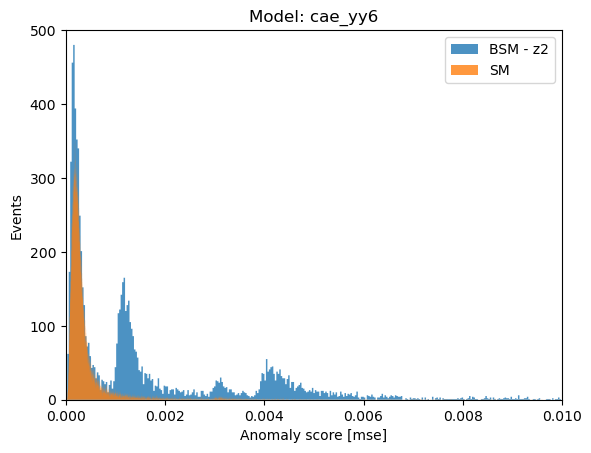

In [138]:
plt.hist(mse_z2_yy6[:,0], bins = 1000, label = "BSM - z2", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 30000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,500])
plt.xlim([0, 0.01])
plt.show();

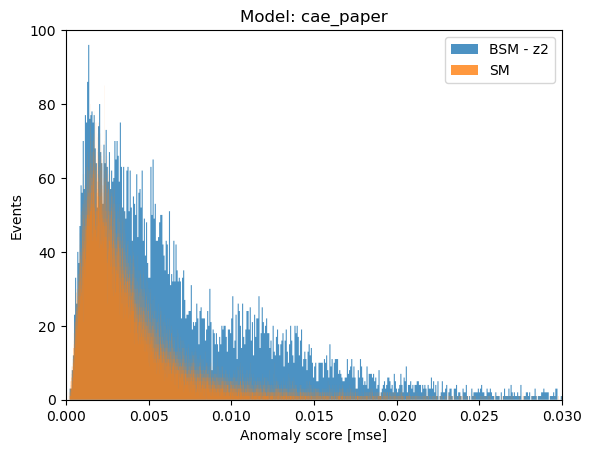

In [208]:
plt.hist(mse_z2_paper[:,0], bins = 1000, label = "BSM - z2", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 20000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,100])
plt.xlim([0, 0.03])
plt.show();

The test data is the main thing to have a look at, as it is the one ised to compute an evaluation metric. BUt the other thing that we have to take into account is that there is a differentiation between two peaks (SM - BSM). But for the z2 set of data the  the *cae_paper* model works a bit worse to differentiate between peaks. When it is evaluated with the *cae_yy6* model the shape is weird as it produces several peaks.

One conclusion that comes from this tests is that different models will work differently for different sets. Like in this case.

With the z1 data set evaluating both models, the *cae_yy6* seems to be doing a better job:

In [140]:
mse_z1_paper = mse(z1_scaled, cae_paper)

  0%|          | 0/3402 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 30ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 32ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 57ms/step - loss: 0.0081 - mse: 0.0081


1/1 [==============================] - 0s 93ms/step - loss: 0.0045 - mse: 0.0045


1/1 [==============================] - 0s 31ms/step - loss: 0.0058 - mse: 0.0058


1/1 [==============================] - 0s 34ms/step - loss: 0.0040 - mse: 0.0040


1/1 [==============================] - 0s 30ms/step - loss: 0.0062 - mse: 0.0062


1/1 [==============================] - 0s 32ms/step - loss: 0.0156 - mse: 0.0156


1/1 [==============================] - 0s 28ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 29ms/step - loss: 0.0036 - mse: 0.0036


1/1 [==============================] - 0s 31ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 32ms/step - loss: 0.0017 - mse: 0.0017


1/1 [==============================] - 0s 31ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 30ms/step - loss: 9.3534e-04 - mse: 9.3534e-04


1/1 [==============================] - 0s 27ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 33ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 29ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 31ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 40ms/step - loss: 0.0066 - mse: 0.0066


1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - mse: 0.0022


1/1 [==============================] - 0s 30ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 31ms/step - loss: 0.0128 - mse: 0.0128


1/1 [==============================] - 0s 32ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 33ms/step - loss: 0.0261 - mse: 0.0261


1/1 [==============================] - 0s 37ms/step - loss: 0.0028 - mse: 0.0028


1/1 [==============================] - 0s 32ms/step - loss: 0.0149 - mse: 0.0149


1/1 [==============================] - 0s 28ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 30ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 29ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 33ms/step - loss: 0.0163 - mse: 0.0163


1/1 [==============================] - 0s 30ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 29ms/step - loss: 0.0030 - mse: 0.0030


In [141]:
mse_z1_yy6 = mse(z1_scaled, cae_yy6)

  0%|          | 0/3402 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step - loss: 2.2753e-04 - mse: 2.2753e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0014 - mse: 0.0014


1/1 [==============================] - 0s 31ms/step - loss: 8.1660e-04 - mse: 8.1660e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.4250e-04 - mse: 2.4250e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.2642e-04 - mse: 1.2642e-04


1/1 [==============================] - 0s 36ms/step - loss: 1.6601e-04 - mse: 1.6601e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 31ms/step - loss: 4.4680e-05 - mse: 4.4680e-05


1/1 [==============================] - 0s 31ms/step - loss: 9.8848e-04 - mse: 9.8848e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.5133e-04 - mse: 1.5133e-04


1/1 [==============================] - 0s 31ms/step - loss: 3.5089e-04 - mse: 3.5089e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.8606e-04 - mse: 1.8606e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 31ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 30ms/step - loss: 2.5239e-04 - mse: 2.5239e-04


1/1 [==============================] - 0s 56ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 29ms/step - loss: 2.6879e-04 - mse: 2.6879e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mse: 0.0011


1/1 [==============================] - 0s 48ms/step - loss: 2.0660e-04 - mse: 2.0660e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.9122e-04 - mse: 1.9122e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.6872e-04 - mse: 1.6872e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.7279e-04 - mse: 1.7279e-04


1/1 [==============================] - 0s 95ms/step - loss: 2.4750e-04 - mse: 2.4750e-04


1/1 [==============================] - 0s 29ms/step - loss: 0.0080 - mse: 0.0080


1/1 [==============================] - 0s 30ms/step - loss: 4.3546e-04 - mse: 4.3546e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.9497e-04 - mse: 1.9497e-04


1/1 [==============================] - 0s 56ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 29ms/step - loss: 1.3607e-04 - mse: 1.3607e-04


1/1 [==============================] - 0s 74ms/step - loss: 1.3416e-04 - mse: 1.3416e-04


1/1 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 30ms/step - loss: 7.5791e-05 - mse: 7.5791e-05


1/1 [==============================] - 0s 30ms/step - loss: 1.3778e-04 - mse: 1.3778e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.3673e-04 - mse: 1.3673e-04


1/1 [==============================] - 0s 37ms/step - loss: 2.0527e-04 - mse: 2.0527e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 31ms/step - loss: 1.9497e-04 - mse: 1.9497e-04


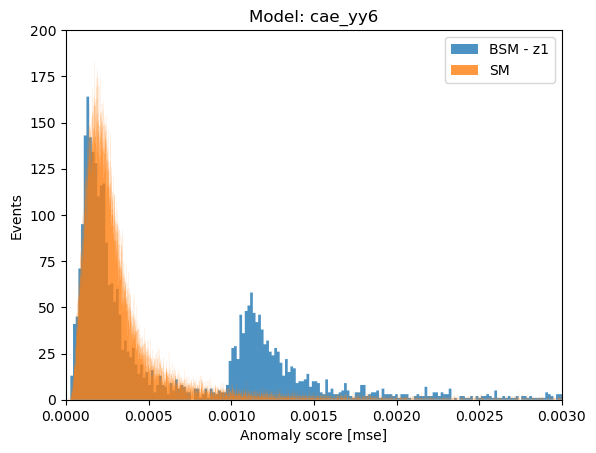

In [158]:
plt.hist(mse_z1_yy6[:,0], bins = 1000, label = "BSM - z1", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 60000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,200])
plt.xlim([0, 0.003])
plt.show();

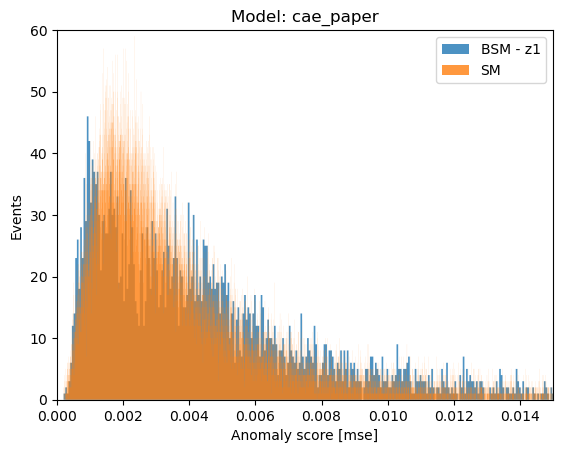

In [210]:
plt.hist(mse_z1_paper[:,0], bins = 1000, label = "BSM - z1", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 30000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,60])
plt.xlim([0, 0.015])
plt.show();

With chaneut2 and chaneut1 data:

In [159]:
mse_chaneut2_paper = mse(chaneut2_scaled, cae_paper)

  0%|          | 0/1376 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step - loss: 0.0055 - mse: 0.0055


1/1 [==============================] - 0s 39ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 42ms/step - loss: 0.0054 - mse: 0.0054


1/1 [==============================] - 0s 27ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 30ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 32ms/step - loss: 0.0082 - mse: 0.0082


1/1 [==============================] - 0s 34ms/step - loss: 0.0102 - mse: 0.0102


1/1 [==============================] - 0s 27ms/step - loss: 0.0085 - mse: 0.0085


1/1 [==============================] - 0s 31ms/step - loss: 0.0086 - mse: 0.0086


1/1 [==============================] - 0s 50ms/step - loss: 0.0080 - mse: 0.0080


1/1 [==============================] - 0s 30ms/step - loss: 0.0048 - mse: 0.0048


1/1 [==============================] - 0s 68ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 29ms/step - loss: 0.0063 - mse: 0.0063


1/1 [==============================] - 0s 99ms/step - loss: 0.0109 - mse: 0.0109


In [170]:
mse_chaneut2_yy6 = mse(chaneut2_scaled, cae_yy6)

  0%|          | 0/1376 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step - loss: 0.0058 - mse: 0.0058


1/1 [==============================] - 0s 30ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 42ms/step - loss: 4.6374e-04 - mse: 4.6374e-04


1/1 [==============================] - 0s 30ms/step - loss: 5.0514e-04 - mse: 5.0514e-04


1/1 [==============================] - 0s 38ms/step - loss: 0.0033 - mse: 0.0033


1/1 [==============================] - 0s 30ms/step - loss: 2.6301e-04 - mse: 2.6301e-04


1/1 [==============================] - 0s 39ms/step - loss: 2.3359e-04 - mse: 2.3359e-04


1/1 [==============================] - 0s 51ms/step - loss: 9.4568e-04 - mse: 9.4568e-04


1/1 [==============================] - 0s 78ms/step - loss: 3.1250e-04 - mse: 3.1250e-04


1/1 [==============================] - 0s 36ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 38ms/step - loss: 2.1809e-04 - mse: 2.1809e-04


1/1 [==============================] - 0s 32ms/step - loss: 1.2008e-04 - mse: 1.2008e-04


1/1 [==============================] - 0s 30ms/step - loss: 1.8535e-04 - mse: 1.8535e-04


1/1 [==============================] - 0s 25ms/step - loss: 1.7015e-04 - mse: 1.7015e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


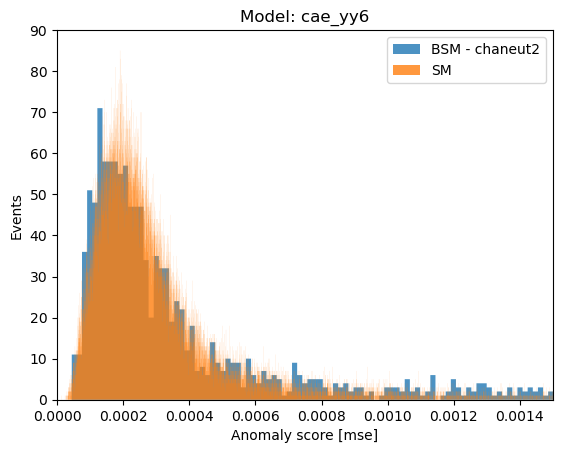

In [211]:
plt.hist(mse_chaneut2_yy6[:,0], bins = 1000, label = "BSM - chaneut2", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 150000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,90])
plt.xlim([0, 0.0015])
plt.show();

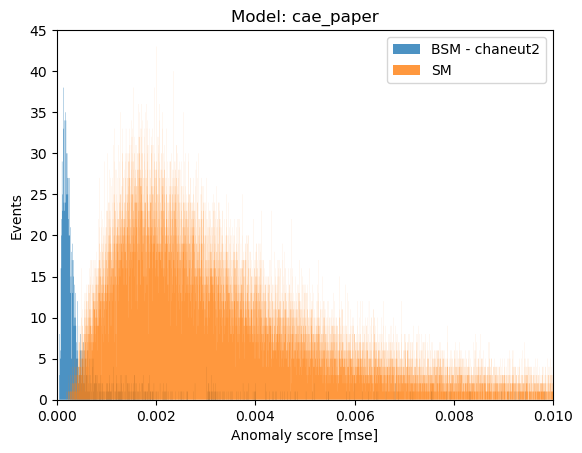

In [213]:
plt.hist(mse_chaneut2_paper[:,0], bins = 2000, label = "BSM - chaneut2", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 50000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,45])
plt.xlim([0, 0.010])
plt.show();

This is an interesting case where for cae_paper for chaneut2 the BSM dat has les anomaly than the SM data so the model does not work at all for it.

In [176]:
mse_chaneut1_paper = mse(chaneut1_scaled, cae_paper)

  0%|          | 0/1513 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step - loss: 0.0032 - mse: 0.0032


1/1 [==============================] - 0s 31ms/step - loss: 0.0027 - mse: 0.0027


1/1 [==============================] - 0s 34ms/step - loss: 0.0061 - mse: 0.0061


1/1 [==============================] - 0s 36ms/step - loss: 0.0108 - mse: 0.0108


1/1 [==============================] - 0s 34ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 31ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 34ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 31ms/step - loss: 0.0063 - mse: 0.0063


1/1 [==============================] - 0s 30ms/step - loss: 0.0118 - mse: 0.0118


1/1 [==============================] - 0s 161ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 34ms/step - loss: 0.0194 - mse: 0.0194


1/1 [==============================] - 0s 30ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 40ms/step - loss: 0.0083 - mse: 0.0083


1/1 [==============================] - 0s 36ms/step - loss: 0.0057 - mse: 0.0057


1/1 [==============================] - 0s 30ms/step - loss: 0.0083 - mse: 0.0083


1/1 [==============================] - 0s 31ms/step - loss: 0.0048 - mse: 0.0048


In [177]:
mse_chaneut1_yy6 = mse(chaneut1_scaled, cae_yy6)

  0%|          | 0/1513 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step - loss: 1.8918e-04 - mse: 1.8918e-04


1/1 [==============================] - 0s 73ms/step - loss: 5.5341e-04 - mse: 5.5341e-04


1/1 [==============================] - 0s 108ms/step - loss: 1.3921e-04 - mse: 1.3921e-04


1/1 [==============================] - 0s 34ms/step - loss: 1.8003e-04 - mse: 1.8003e-04


1/1 [==============================] - 0s 77ms/step - loss: 7.2253e-04 - mse: 7.2253e-04


1/1 [==============================] - 0s 142ms/step - loss: 1.6791e-04 - mse: 1.6791e-04


1/1 [==============================] - 0s 57ms/step - loss: 1.5777e-04 - mse: 1.5777e-04


1/1 [==============================] - 0s 43ms/step - loss: 2.1039e-04 - mse: 2.1039e-04


1/1 [==============================] - 0s 48ms/step - loss: 0.0020 - mse: 0.0020


1/1 [==============================] - 0s 34ms/step - loss: 1.2143e-04 - mse: 1.2143e-04


1/1 [==============================] - 0s 30ms/step - loss: 2.5071e-04 - mse: 2.5071e-04


1/1 [==============================] - 0s 41ms/step - loss: 4.7722e-04 - mse: 4.7722e-04


1/1 [==============================] - 0s 31ms/step - loss: 2.2848e-04 - mse: 2.2848e-04


1/1 [==============================] - 0s 60ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 28ms/step - loss: 3.5021e-04 - mse: 3.5021e-04


1/1 [==============================] - 0s 62ms/step - loss: 1.6089e-04 - mse: 1.6089e-04


1/1 [==============================] - 0s 42ms/step - loss: 2.2554e-04 - mse: 2.2554e-04


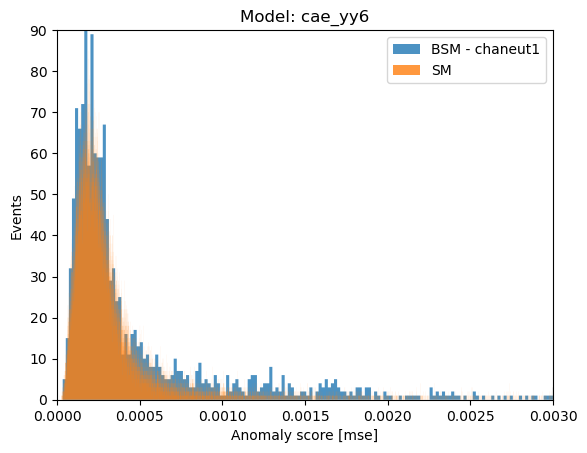

In [215]:
plt.hist(mse_chaneut1_yy6[:,0], bins = 1000, label = "BSM - chaneut1", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 150000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,90])
plt.xlim([0, 0.003])
plt.show();

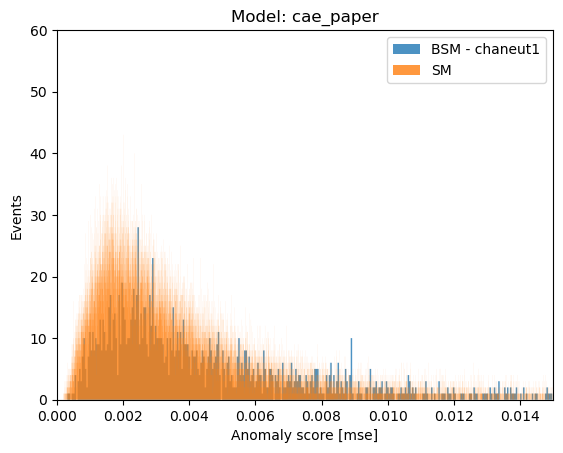

In [181]:
plt.hist(mse_chaneut1_paper[:,0], bins = 1000, label = "BSM - chaneut1", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 50000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,60])
plt.xlim([0, 0.015])
plt.show();

Comparison between both models for the chacha's data sets:

In [182]:
mse_chacha3_paper = mse(chacha3_scaled, cae_paper)

  0%|          | 0/1205 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step - loss: 0.0076 - mse: 0.0076


1/1 [==============================] - 0s 28ms/step - loss: 0.0041 - mse: 0.0041


1/1 [==============================] - 0s 22ms/step - loss: 0.0039 - mse: 0.0039


1/1 [==============================] - 0s 30ms/step - loss: 0.0108 - mse: 0.0108


1/1 [==============================] - 0s 39ms/step - loss: 0.0143 - mse: 0.0143


1/1 [==============================] - 0s 32ms/step - loss: 0.0024 - mse: 0.0024


1/1 [==============================] - 0s 40ms/step - loss: 0.0018 - mse: 0.0018


1/1 [==============================] - 0s 32ms/step - loss: 0.0029 - mse: 0.0029


1/1 [==============================] - 0s 32ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 39ms/step - loss: 0.0196 - mse: 0.0196


1/1 [==============================] - 0s 32ms/step - loss: 0.0201 - mse: 0.0201


1/1 [==============================] - 0s 31ms/step - loss: 0.0060 - mse: 0.0060


In [183]:
mse_chacha3_yy6 = mse(chacha3_scaled, cae_yy6)

  0%|          | 0/1205 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step - loss: 4.8256e-04 - mse: 4.8256e-04


1/1 [==============================] - 0s 31ms/step - loss: 0.0030 - mse: 0.0030


1/1 [==============================] - 0s 31ms/step - loss: 1.5140e-04 - mse: 1.5140e-04


1/1 [==============================] - 0s 39ms/step - loss: 6.6522e-04 - mse: 6.6522e-04


1/1 [==============================] - 0s 32ms/step - loss: 2.7838e-04 - mse: 2.7838e-04


1/1 [==============================] - 0s 44ms/step - loss: 1.2438e-04 - mse: 1.2438e-04


1/1 [==============================] - 0s 33ms/step - loss: 1.4828e-04 - mse: 1.4828e-04


1/1 [==============================] - 0s 34ms/step - loss: 8.0631e-05 - mse: 8.0631e-05


1/1 [==============================] - 0s 34ms/step - loss: 7.0608e-04 - mse: 7.0608e-04


1/1 [==============================] - 0s 30ms/step - loss: 0.0044 - mse: 0.0044


1/1 [==============================] - 0s 31ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 44ms/step - loss: 2.6549e-04 - mse: 2.6549e-04


1/1 [==============================] - 0s 28ms/step - loss: 1.9467e-04 - mse: 1.9467e-04


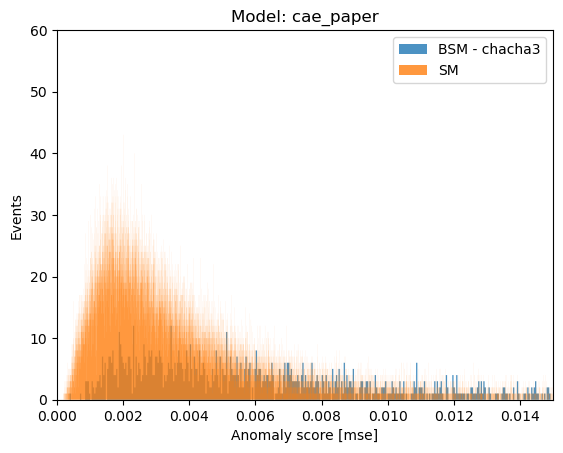

In [188]:
plt.hist(mse_chacha3_paper[:,0], bins = 1000, label = "BSM - chacha3", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 50000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,60])
plt.xlim([0, 0.015])
plt.show();

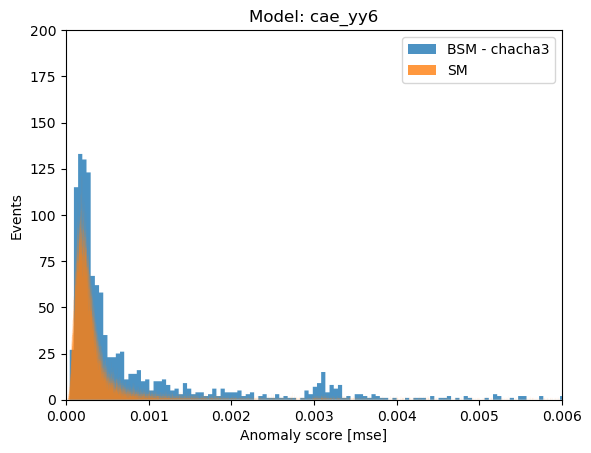

In [225]:
plt.hist(mse_chacha3_yy6[:,0], bins = 300, label = "BSM - chacha3", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 100000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,200])
plt.xlim([0, 0.006])
plt.show();

In [184]:
mse_chacha2_paper = mse(chacha2_scaled, cae_paper)

  0%|          | 0/849 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step - loss: 0.0016 - mse: 0.0016


1/1 [==============================] - 0s 30ms/step - loss: 0.0012 - mse: 0.0012


1/1 [==============================] - 0s 32ms/step - loss: 0.0013 - mse: 0.0013


1/1 [==============================] - 0s 35ms/step - loss: 0.0034 - mse: 0.0034


1/1 [==============================] - 0s 35ms/step - loss: 0.0019 - mse: 0.0019


1/1 [==============================] - 0s 31ms/step - loss: 0.0524 - mse: 0.0524


1/1 [==============================] - 0s 79ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 39ms/step - loss: 0.0047 - mse: 0.0047


1/1 [==============================] - 0s 108ms/step - loss: 0.0033 - mse: 0.0033


In [185]:
mse_chacha2_yy6 = mse(chacha2_scaled, cae_yy6)

  0%|          | 0/849 [00:00<?, ?it/s]

1/1 [==============================] - 0s 132ms/step - loss: 1.3762e-04 - mse: 1.3762e-04


1/1 [==============================] - 0s 27ms/step - loss: 1.8265e-04 - mse: 1.8265e-04


1/1 [==============================] - 0s 36ms/step - loss: 0.0026 - mse: 0.0026


1/1 [==============================] - 0s 36ms/step - loss: 3.1361e-04 - mse: 3.1361e-04


1/1 [==============================] - 0s 31ms/step - loss: 7.8597e-05 - mse: 7.8597e-05


1/1 [==============================] - 0s 66ms/step - loss: 2.4474e-04 - mse: 2.4474e-04


1/1 [==============================] - 0s 37ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 182ms/step - loss: 0.0031 - mse: 0.0031


1/1 [==============================] - 0s 31ms/step - loss: 3.3611e-04 - mse: 3.3611e-04


1/1 [==============================] - 0s 29ms/step - loss: 4.4930e-04 - mse: 4.4930e-04


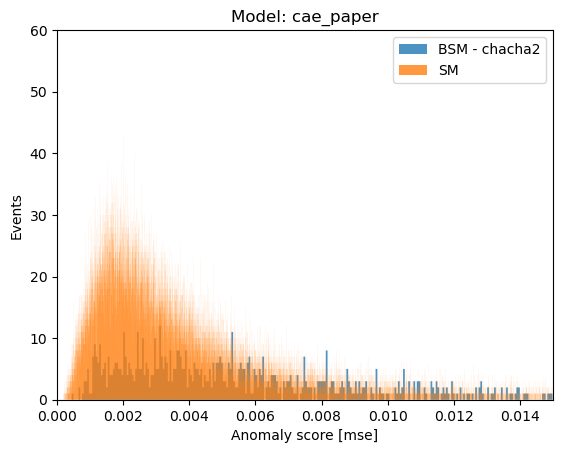

In [191]:
plt.hist(mse_chacha2_paper[:,0], bins = 1000, label = "BSM - chacha2", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 50000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,60])
plt.xlim([0, 0.015])
plt.show();

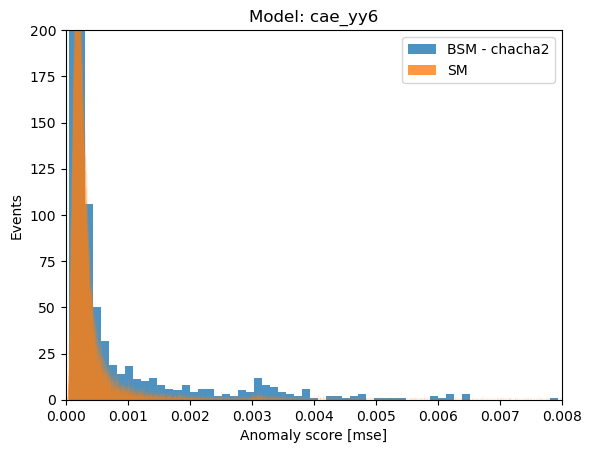

In [232]:
plt.hist(mse_chacha2_yy6[:,0], bins = 100, label = "BSM - chacha2", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 40000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,200])
plt.xlim([0, 0.008])
plt.show();

In [186]:
mse_chacha1_paper = mse(chacha1_scaled, cae_paper)

  0%|          | 0/665 [00:00<?, ?it/s]

1/1 [==============================] - 0s 61ms/step - loss: 0.0023 - mse: 0.0023


1/1 [==============================] - 0s 29ms/step - loss: 0.0210 - mse: 0.0210


1/1 [==============================] - 0s 42ms/step - loss: 0.0051 - mse: 0.0051


1/1 [==============================] - 0s 110ms/step - loss: 8.8084e-04 - mse: 8.8084e-04


1/1 [==============================] - 0s 38ms/step - loss: 0.0059 - mse: 0.0059


1/1 [==============================] - 0s 35ms/step - loss: 0.0021 - mse: 0.0021


1/1 [==============================] - 0s 211ms/step - loss: 0.0021 - mse: 0.0021


In [187]:
mse_chacha1_yy6 = mse(chacha1_scaled, cae_yy6)

  0%|          | 0/665 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step - loss: 4.2028e-04 - mse: 4.2028e-04


1/1 [==============================] - 0s 79ms/step - loss: 0.0010 - mse: 0.0010


1/1 [==============================] - 0s 40ms/step - loss: 9.3025e-05 - mse: 9.3025e-05


1/1 [==============================] - 0s 79ms/step - loss: 1.1102e-04 - mse: 1.1102e-04


1/1 [==============================] - 0s 47ms/step - loss: 1.7318e-04 - mse: 1.7318e-04


1/1 [==============================] - 0s 40ms/step - loss: 3.1639e-04 - mse: 3.1639e-04


1/1 [==============================] - 0s 29ms/step - loss: 1.7995e-04 - mse: 1.7995e-04


1/1 [==============================] - 0s 31ms/step - loss: 1.7801e-04 - mse: 1.7801e-04


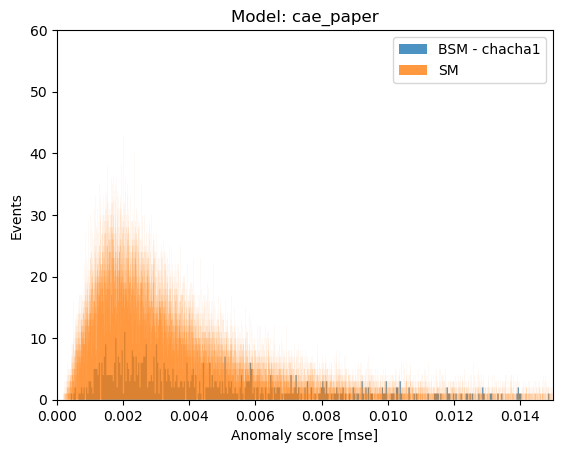

In [192]:
plt.hist(mse_chacha1_paper[:,0], bins = 1000, label = "BSM - chacha1", **kwargs)
plt.hist(mse_sm_paper[:,0], bins = 50000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.legend()
plt.ylim([0,60])
plt.xlim([0, 0.015])
plt.show();

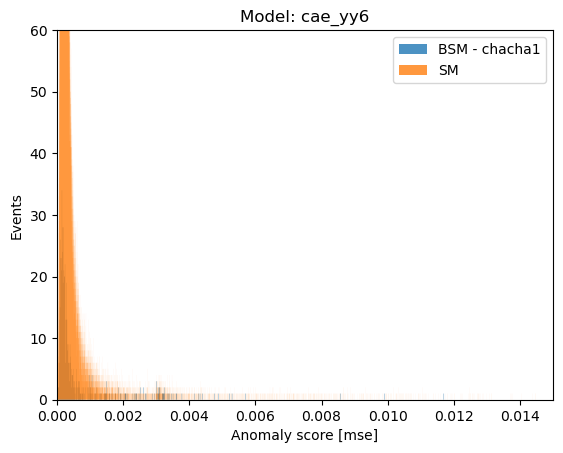

In [193]:
plt.hist(mse_chacha1_yy6[:,0], bins = 1000, label = "BSM - chacha1", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 50000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,60])
plt.xlim([0, 0.015])
plt.show();

For all the chacha's data sets they all follow the same tendency: none of the AE works that well, it seems like the data sets are too smalls, if I had to chose one I would chose the cae_yy6.

## Summary of comparing the two AE models with all the data sets

Summary of the evaluation:

|data set / model   |***cae_yy6*** | ***cae_paper*** | 
| --- |---|---|
|**glu1** |ok| better|
| **z2** |better|ok|
|  **z1**|better|ok|
|   **chaneut2**|no|worse|
|  **chaneut1** |no|no|
| **chacha3** |ok|no|
| **chacha2** |ok|no|
| **chacha1** |ok|no|


* Which data set looks more anomalous than others? ie. Which models are less or more similar to the SM: The glu1 and z2 and z1 data sets (gluino and Z' decay to leptons) are the data sets that show more anomaly and differentiation from teh SM data. The SUSY chargino-chargino and chargino-neutralino are not showing that much anomaly when evaluated with these two models.

**Because of time limit and because it seems like a very systematic and repetitive process now I am going to do a more in detail evaluation of the model with only taking into account the Z to lepton decay data set evaluated with the cae_yy6 model, as it worked well (but it didnt worked as well as the gluino one, so gluino histogram also analyzed). But the process follow following can be done to any of the sets in the same way and the comparison of values between different data sets and BSM process would be very interesting and helpful to understant the model**

# Z' decay to leptons data (z1)

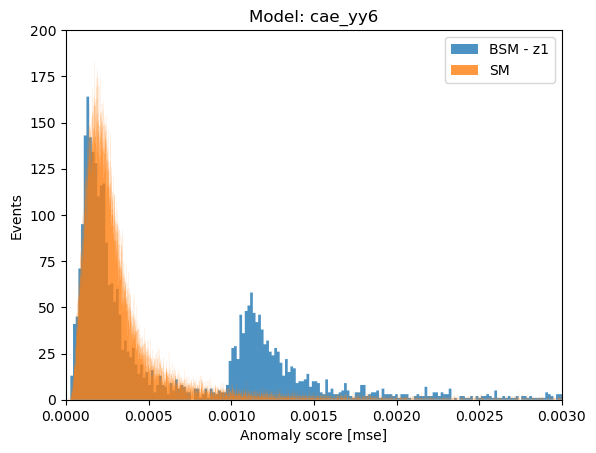

In [234]:
plt.hist(mse_z1_yy6[:,0], bins = 1000, label = "BSM - z1", **kwargs)
plt.hist(mse_sm_yy6[:,0], bins = 60000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.legend()
plt.ylim([0,200])
plt.xlim([0, 0.003])
plt.show();

I'm now going to modify the plot a bit to normalised and shorten more the axis to get a normalized anomaly score :

In [237]:
norm_z1 = mse_z1_yy6[:,0] / 0.00200
norm_mse = mse_sm_yy6[:,0] / 0.00200

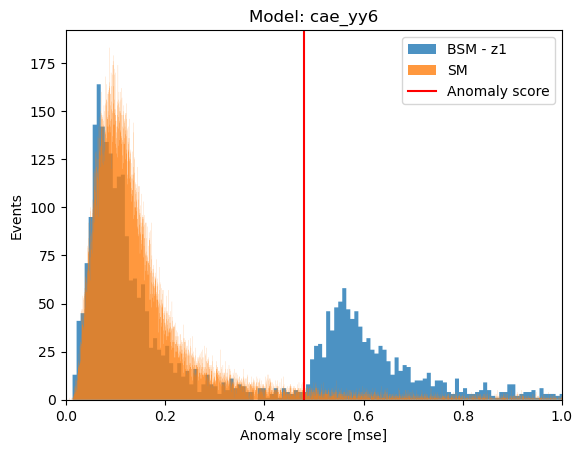

In [250]:
plt.hist(norm_z1, bins = 1000, label = "BSM - z1", **kwargs)
plt.hist(norm_mse, bins = 60000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_yy6")
plt.xlim([0,1])
plt.axvline(0.48, color = "r", label = "Anomaly separation bgn-signal")
plt.legend()
plt.show();

With the anomaly score range defined in the plot then the signal efficiency and the Significance imporvement can be computed: 

# Signal Efficiency

The signal efficiency can be calculated as eff = S / sqrt(S + B) where S and B are the number of signal and background events respectively.

In [252]:
z1 = (mse_z1_yy6[:,0])

In [253]:
signal =  0
bgn = 0

for i in z1:
    if i >= 0.0010:
        signal += 1
    else:
        bgn += 1
    

In [255]:
sig_eff = signal / np.sqrt(signal + bgn)
print(sig_eff)

22.33969611117842


# Gluino data set (g1)

In [264]:
norm_g1 = mse_glu1_paper[:,0] / 0.09
norm_mse2 = mse_sm_paper[:,0] / 0.09

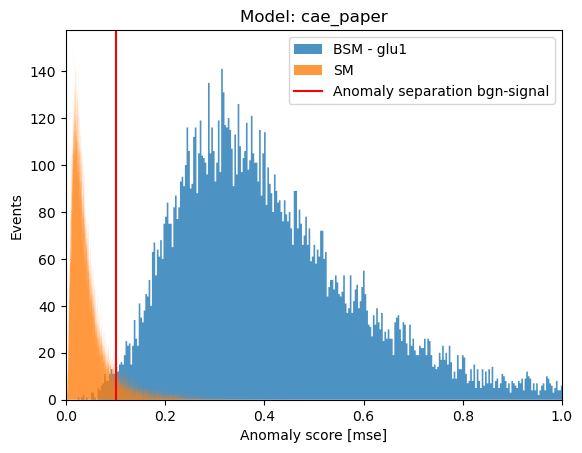

In [269]:
plt.hist(norm_g1, bins = 1000, label = "BSM - glu1", **kwargs)
plt.hist(norm_mse2, bins = 10000, label = "SM", **kwargs)
plt.ylabel("Events")
plt.xlabel("Anomaly score [mse]")
plt.title("Model: cae_paper")
plt.xlim([0, 1])
plt.axvline(0.10, color = "r", label = "Anomaly separation bgn-signal")
plt.legend()


plt.show();

In [270]:
g1 = (mse_glu1_paper[:,0])

In [271]:
signal2 =  0
bgn2 = 0

for i in g1:
    if i >= 0.0010:
        signal2 += 1
    else:
        bgn2 += 1
    

In [272]:
sig_eff2 = signal2 / np.sqrt(signal2 + bgn2)
print(sig_eff2)

116.73045875006233


Just by looking at the plots it can be seen that the signal efficiency of the gluino data set is better thant the one for the Z decay.

# Further analysis that can be done: Significance improvement

Another analysis that can be done for the model chosen with this data (shown in reference [1] section 5.2.2) is the calculation of the significance improvement. Basically that section explains how the significance of the "new physics" signals (BSM) can be estimated using the following process: 
* First you calculate the significance of the signal before any selection is done (selection of data as using the model and then deciding from the anomaly score what is signal and what is not). This is calculated as sig_initial = S / sqrt(B) where sig_initial is the significance of the signal before selection, and S and B are the number of signal and background events respectively.
* Then, when the anomaly detector (the model evaluation is applied) the number of signal and background events changes as: sig_after = S'/sqrt(B') where sig_after is the significance of the signal after selection, and S' and B' are the number of signal and backgronud events after selection. This is then: sig_after = S'/sqrt(B') = e_s * S / sqrt (e_b * B) = sig_initial * (e_s / sqrt(e_b) ), and from that we can extract the significance improvement as SI = e_s / sqrt (e_b). This is much better explain in the section of the paper mentioned before.

An importnat thing to note about this Significance Improvement value is that and anomaly detection technique is not actually capable of discovery "new physics", as to actually corroborate that you also need to take into account the crosssections of the processes. but this analysis still shows how much the anomaly detector can improve the statistical purity of the signal over SM data.

# Possible improvements

There are a couple of imporvements that I think could be done with more time/resources for this project:
* Use the GridSearch method to optimise the architecture of the Autoencoder.
* Use real collision data to make the Autoencoder more 'used to' background coming from the detector noise.
* With data from other decay channels you could do and analysis with more info to compare as it allows to look at the physics models as a whole and to help looking for the best opportunity to discover them across all channels.
* With more computational time I would have tried to find an AE architecture for each BSM data set, by evaluating them with several different models instead of only evaluating 2 AE for only a couple data sets.
* Something that for sure looking back I would imporve is my method of evaluating the mse for all the events, it takes a lot of time to run.
* For future imporvements also plot histograms of the different features for background and BSM data and if they are really similar those features shouldn't make a difference for the autoencoder.
* train the model with not all the variable ¡s only the ones that actually differentiate from the SM data

# References:

[1] The Dark Machines Anomaly Score Challenge: Benchmark Data and Model Independent Event Classification for the Large Hadron Collider, *Aarrestad et al*, 2021.

[2] Deep Autoencoders for Data Compression in High Energy Physics, *Eric Wulff*, Master Thesis, Lund University, 2020. https://lup.lub.lu.se/luur/download?func=downloadFile&recordOId=9004751&fileOId=9004752

[3] Anomaly detection using Deep Autoencoders for the assessment of the quality of the data acquired by the CMS experiment, *Pol et al*, EPJ Web of Conferences 214, 06008 (2019), https://doi.org/10.1051/epjconf/201921406008.

# **NOTE:** This code can run with all the needed data files in the same folder, but, it will take a long time to run, specially the part of the mse evaluation.

**When I did a first trial of the project it is the one I used first and it worked super well on the data, but know everytime I try to re-run that code it doesn't work well I don't know why. I have also submitted that jupyter notebook (DAML_villatoro_TRIAL!.ipynb, so it can be checked how well it was doing the anomaly detection, but if you run the whole notebook again it will not work, not sure why ...**

# **End of the notebook**